## Table of Contents

1. Data Loading & Initial Checks
2. Initial EDA (Exploratory Data Analysis)
3. Data Merging
4. Data Cleaning & Normalization
5. Exploratory Data Analysis (EDA)
6. Baseline Modeling
7. Feature Engineering
8. Advanced Modeling
9. Evaluation & Interpretation


<a id="s01" class="anchor-offset"></a>
<a id="s1" class="anchor-offset"></a>
## 1. Data Loading & Initial Checks

We load the core HDB resale dataset and auxiliary data (block details, MRT stations, schools, malls). Initial checks include previewing the data, identifying missing values, and detecting duplicates to ensure data quality before analysis.

In [151]:
# ============================================================
# STEP 1 — Data Loading & Initial Checks
# ============================================================

# Imports
import re
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import BallTree

# Define File Paths
DATA_DIR = "/Users/gm/Desktop/cs-5228-2510-project"
TRAIN_PATH = f"{DATA_DIR}/train.csv"
TEST_PATH  = f"{DATA_DIR}/test.csv"
AUX_DIR    = f"{DATA_DIR}/auxiliary-data"
HDB_BLOCK_DETAILS_PATH = f"{AUX_DIR}/sg-hdb-block-details.csv"
MRT_PATH   = f"{AUX_DIR}/sg-mrt-stations.csv"
PRI_PATH   = f"{AUX_DIR}/sg-primary-schools.csv"
SEC_PATH   = f"{AUX_DIR}/sg-secondary-schools.csv"
MALL_PATH  = f"{AUX_DIR}/sg-shopping-malls.csv"
HAWKERS_PATH = f"{AUX_DIR}/sg-gov-hawkers.csv"

# Load Data 
train_df = pd.read_csv(TRAIN_PATH)
test_df  = pd.read_csv(TEST_PATH)
hdb_block_details_df = pd.read_csv(HDB_BLOCK_DETAILS_PATH)
mrt_stations_df = pd.read_csv(MRT_PATH)
primary_schools_df = pd.read_csv(PRI_PATH)
secondary_schools_df = pd.read_csv(SEC_PATH)
shopping_malls_df = pd.read_csv(MALL_PATH)
hawkers_df = pd.read_csv(HAWKERS_PATH)

# Constants
EARTH_RADIUS_KM = 6371.0

In [152]:
import pandas as pd

print("=== INITIAL CHECKS ===\n")

# Dataset shapes
print(f"Train shape: {train_df.shape[0]:,} rows × {train_df.shape[1]} columns")
print(f"Test shape:  {test_df.shape[0]:,} rows × {test_df.shape[1]} columns\n")

# Preview first few rows
print("Train preview:")
display(train_df.head())
print("Test preview:")
display(test_df.head())

# Data types summary
print("\nData types in train dataset:")
print(train_df.dtypes.value_counts())

# Missing values summary
def missing_table(df, name):
    miss = df.isna().sum()
    rate = (miss / len(df)).round(4)
    mt = pd.DataFrame({'missing': miss, 'rate': rate})
    mt = mt[mt['missing'] > 0].sort_values('rate', ascending=False)
    if mt.empty:
        print(f"No missing values in {name} dataset.")
    else:
        print(f"Missing values in {name} dataset:")
        display(mt)

print("\nMissing values analysis:")
missing_table(train_df, "train")
missing_table(test_df, "test")

# Duplicate analysis
dup_train = train_df.duplicated().sum()
dup_test = test_df.duplicated().sum()
print(f"\nDuplicate Analysis:")
print(f"  - Duplicate rows within training dataset: {dup_train}")
print(f"  - Duplicate rows within test dataset:     {dup_test}")

# Overlap analysis
overlap = pd.merge(train_df, test_df, how='inner')
print(f"  - Rows that are identical in both train and test datasets: {len(overlap)}")

=== INITIAL CHECKS ===

Train shape: 162,691 rows × 11 columns
Test shape:  50,000 rows × 10 columns

Train preview:


,MONTH,TOWN,FLAT_TYPE,BLOCK,STREET,FLOOR_RANGE,FLOOR_AREA_SQM,FLAT_MODEL,ECO_CATEGORY,LEASE_COMMENCE_DATA,RESALE_PRICE
0,2020-10,woodlands,4 room,681B,woodlands drive 62,07 to 09,102.0,premium apartment,uncategorized,2000,420000.0
1,2021-07,bishan,4 room,264,bishan street 24,07 to 09,104.0,model a,uncategorized,1992,585000.0
2,2021-05,bukit panjang,4 room,520,jelapang road,19 to 21,102.0,model a,uncategorized,1998,450000.0
3,2021-08,punggol,4 room,121B,edgedale plains,16 to 18,93.0,model a,uncategorized,2017,465000.0
4,2023-05,hougang,5 room,997B,Buangkok Crescent,10 to 12,113.0,improved,uncategorized,2018,710000.0


Test preview:


,MONTH,TOWN,FLAT_TYPE,BLOCK,STREET,FLOOR_RANGE,FLOOR_AREA_SQM,FLAT_MODEL,ECO_CATEGORY,LEASE_COMMENCE_DATA
0,2025-06,sembawang,3 room,115D,Canberra Walk,04 to 06,68.0,model a,uncategorized,2018
1,2020-01,bukit merah,4 room,118A,jalan membina,01 to 03,90.0,model a,uncategorized,2003
2,2025-06,bishan,3 room,22,Sin Ming Road,10 to 12,68.0,improved,uncategorized,1973
3,2022-10,hougang,4 room,635,Hougang Avenue 8,10 to 12,84.0,simplified,uncategorized,1987
4,2024-02,bukit panjang,4 room,275,bangkit road,10 to 12,104.0,model a,uncategorized,1988



Data types in train dataset:
object     8
float64    2
int64      1
Name: count, dtype: int64

Missing values analysis:
No missing values in train dataset.
No missing values in test dataset.

Duplicate Analysis:
  - Duplicate rows within training dataset: 121
  - Duplicate rows within test dataset:     124
  - Rows that are identical in both train and test datasets: 851


<a id="s02" class="anchor-offset"></a>
<a id="s2" class="anchor-offset"></a>
## 2. Initial EDA (Exploratory Data Analysis)

We perform an initial exploration of the raw dataset to understand its structure, data types, and potential issues such as missing values or outliers. This step helps inform subsequent data cleaning and feature engineering decisions.

In [153]:
# Data types and summary statistics
print("Data types:\n", train_df.dtypes)
print("\nNumeric feature summary:\n", train_df.describe())
print("\nCategorical feature summary:\n", train_df.describe(include='object'))

Data types:
 MONTH                   object
TOWN                    object
FLAT_TYPE               object
BLOCK                   object
STREET                  object
FLOOR_RANGE             object
FLOOR_AREA_SQM         float64
FLAT_MODEL              object
ECO_CATEGORY            object
LEASE_COMMENCE_DATA      int64
RESALE_PRICE           float64
dtype: object

Numeric feature summary:
        FLOOR_AREA_SQM  LEASE_COMMENCE_DATA  RESALE_PRICE
count   162691.000000        162691.000000  1.626910e+05
mean        96.891250          1996.358993  5.188430e+05
std         24.030547            14.245920  1.832442e+05
min         31.000000          1966.000000  1.500000e+05
25%         82.000000          1985.000000  3.820000e+05
50%         93.000000          1996.000000  4.880000e+05
75%        112.000000          2011.000000  6.220000e+05
max        366.700000          2022.000000  1.658888e+06

Categorical feature summary:
           MONTH      TOWN FLAT_TYPE   BLOCK            STREET

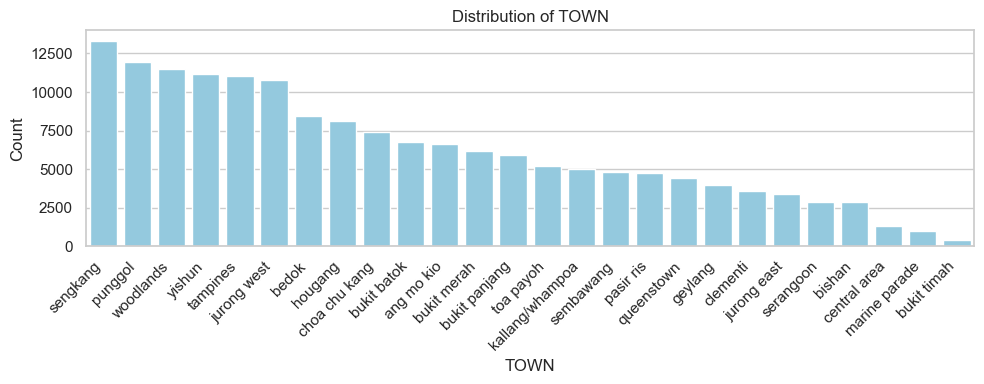

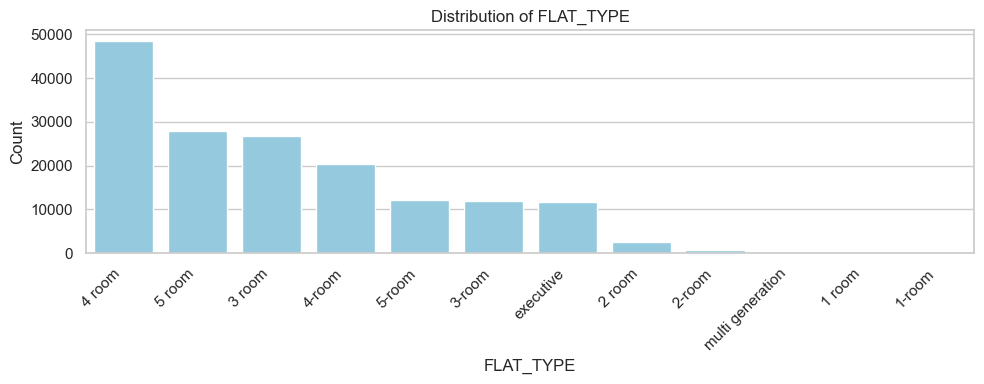

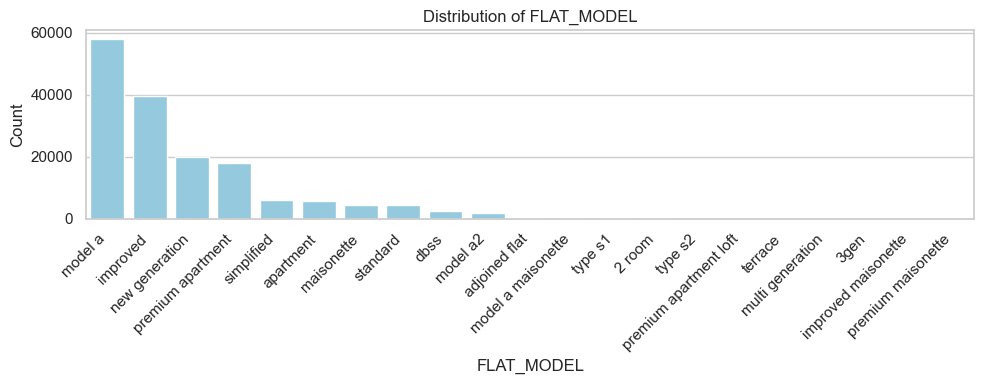

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme(style="whitegrid")
categorical_cols = ['TOWN', 'FLAT_TYPE', 'FLAT_MODEL', 'FLOOR_RANGE']

# Categorical Feature Distributions
for col in categorical_cols:
    plt.figure(figsize=(10, 4))
    value_counts = train_df[col].value_counts()
    sns.barplot(
        x=value_counts.index,
        y=value_counts.values,
        color="skyblue"  # or palette="Blues" for a multi-color look
    )
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

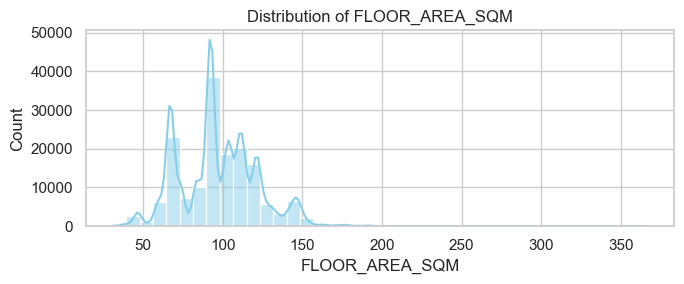

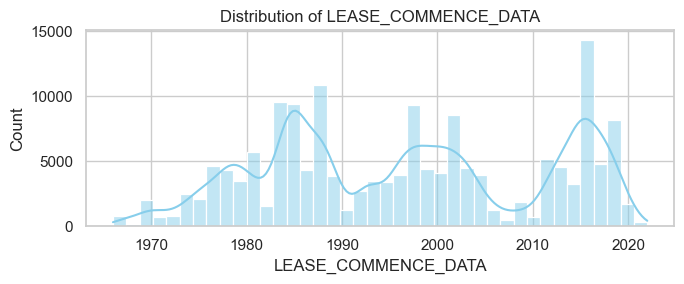

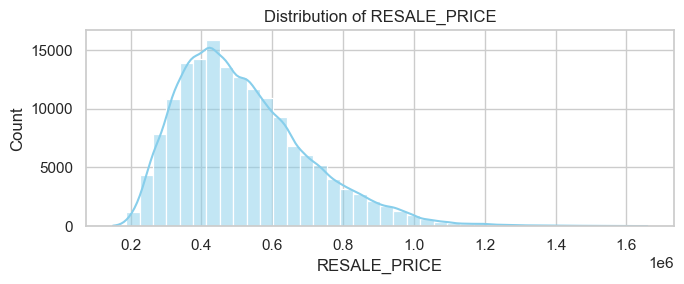

In [156]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme(style="whitegrid")
numeric_cols = ['FLOOR_AREA_SQM', 'LEASE_COMMENCE_DATA', 'RESALE_PRICE']

for col in numeric_cols:
    plt.figure(figsize=(7, 3))
    sns.histplot(train_df[col], bins=40, kde=True, color="skyblue")
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.tight_layout()
    plt.show()

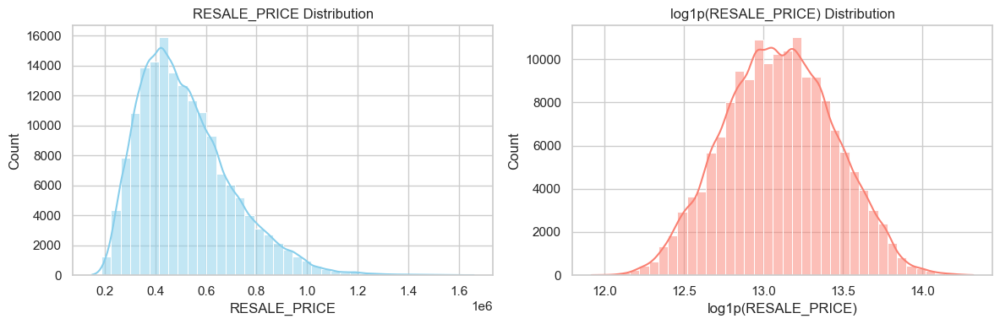

In [157]:
# Distribution and log-transform of RESALE_PRICE
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

sns.set_theme(style="whitegrid")
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
sns.histplot(train_df['RESALE_PRICE'], bins=40, kde=True, color="skyblue")
plt.title('RESALE_PRICE Distribution')
plt.xlabel('RESALE_PRICE')

plt.subplot(1, 2, 2)
sns.histplot(np.log1p(train_df['RESALE_PRICE']), bins=40, kde=True, color="salmon")
plt.title('log1p(RESALE_PRICE) Distribution')
plt.xlabel('log1p(RESALE_PRICE)')

plt.tight_layout()
plt.show()

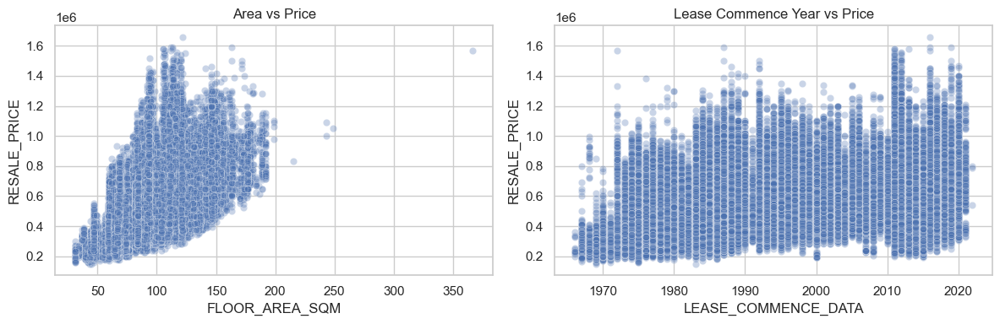

/var/folders/j_/1jv8vcms5z32pv1h455d7g1w0000gn/T/ipykernel_92556/2416457233.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='FLAT_TYPE', y='RESALE_PRICE', data=train_df, palette="Set2")


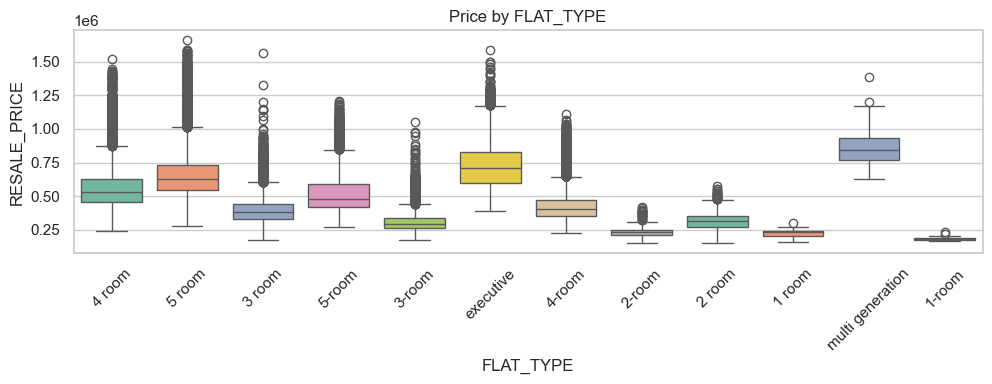

In [158]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme(style="whitegrid")

# Scatterplots for relationships
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
sns.scatterplot(x='FLOOR_AREA_SQM', y='RESALE_PRICE', data=train_df, alpha=0.3)
plt.title('Area vs Price')

plt.subplot(1, 2, 2)
sns.scatterplot(x='LEASE_COMMENCE_DATA', y='RESALE_PRICE', data=train_df, alpha=0.3)
plt.title('Lease Commence Year vs Price')

plt.tight_layout()
plt.show()

# Boxplot of RESALE_PRICE by FLAT_TYPE
plt.figure(figsize=(10, 4))
sns.boxplot(x='FLAT_TYPE', y='RESALE_PRICE', data=train_df, palette="Set2")
plt.title('Price by FLAT_TYPE')
plt.xlabel('FLAT_TYPE')
plt.ylabel('RESALE_PRICE')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

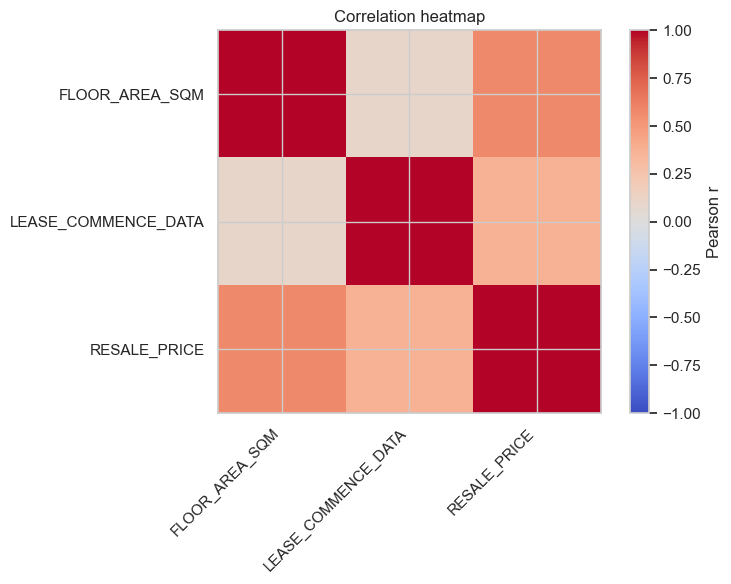

In [159]:
# Correlation matrix for numeric features
corr = train_df.select_dtypes(include=[np.number]).corr()
plt.figure(figsize=(8,6))
plt.imshow(corr, cmap='coolwarm', vmin=-1, vmax=1)
plt.colorbar(label='Pearson r')
plt.xticks(range(len(corr.columns)), corr.columns, rotation=45, ha='right')
plt.yticks(range(len(corr.index)), corr.index)
plt.title('Correlation heatmap')
plt.tight_layout()
plt.show()

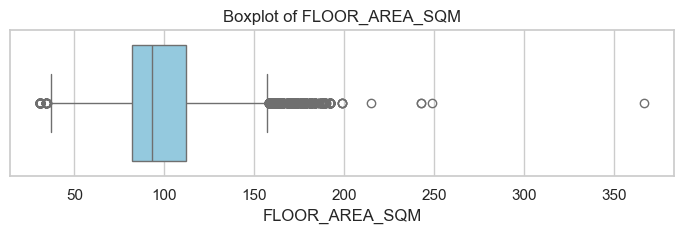

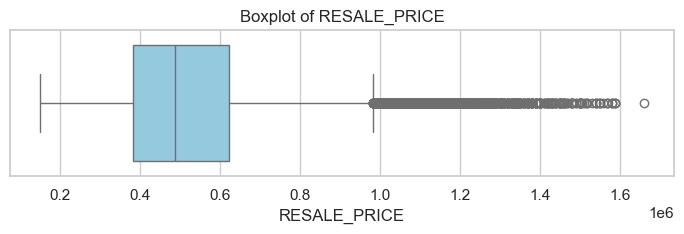

In [160]:
# Boxplots for outlier detection
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme(style="whitegrid")
for col in ['FLOOR_AREA_SQM', 'RESALE_PRICE']:
    plt.figure(figsize=(7, 2.5))
    sns.boxplot(x=train_df[col], color="skyblue")
    plt.title(f'Boxplot of {col}')
    plt.xlabel(col)
    plt.tight_layout()
    plt.show()

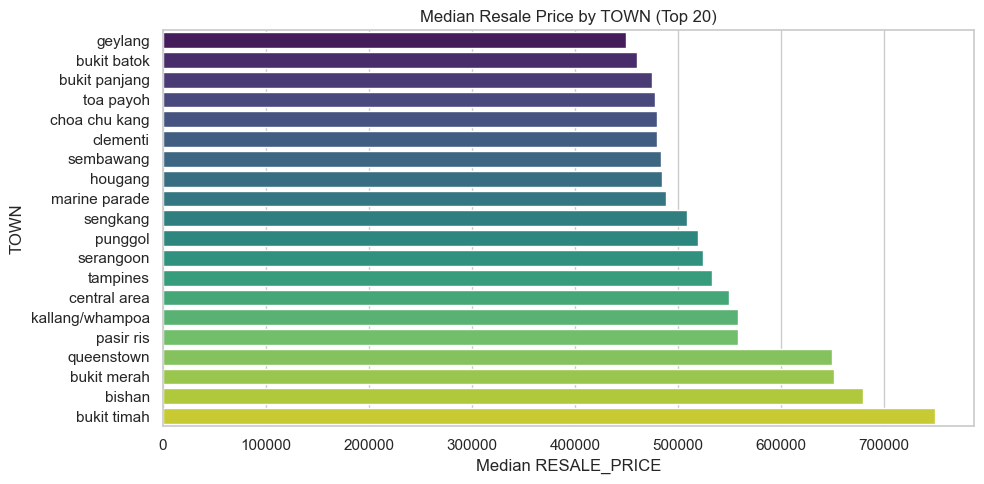

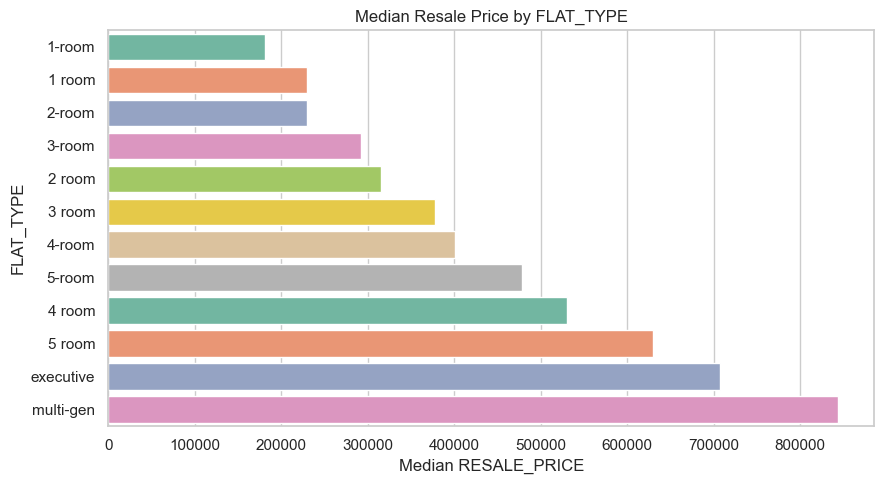

In [161]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme(style="whitegrid")

# Compute median price stats if not already defined
try:
    town_stats
except NameError:
    town_stats = (train_df.groupby('TOWN')['RESALE_PRICE']
                  .median()
                  .sort_values(ascending=False))

try:
    flat_type_stats
except NameError:
    flat_type_stats = (train_df.groupby('FLAT_TYPE')['RESALE_PRICE']
                       .median()
                       .sort_values(ascending=False))

# Median price by TOWN (Top 20)
# Prepare a tidy DataFrame for seaborn and avoid palette deprecation by mapping hue
top_towns = town_stats.head(20).sort_values(ascending=True)
top_towns_df = top_towns.reset_index()
top_towns_df.columns = ['TOWN', 'Median_RESale_Price']

plt.figure(figsize=(10, 5))
sns.barplot(data=top_towns_df, x='Median_RESale_Price', y='TOWN', hue='TOWN', palette='viridis', legend=False)
plt.title('Median Resale Price by TOWN (Top 20)')
plt.xlabel('Median RESALE_PRICE')
plt.ylabel('TOWN')
plt.tight_layout()
plt.show()

# Median price by FLAT_TYPE — horizontal bars with hue (no overlap)
name_map = {'multi generation': 'multi-gen'}
flat_type_df = flat_type_stats.reset_index()
flat_type_df.columns = ['FLAT_TYPE', 'Median_RESale_Price']
flat_type_df['FLAT_TYPE_SHORT'] = flat_type_df['FLAT_TYPE'].replace(name_map)

# Sort so smallest at bottom, largest at top (adjust ascending as you prefer)
flat_type_df = flat_type_df.sort_values('Median_RESale_Price', ascending=True)

plt.figure(figsize=(9, 5))
sns.barplot(
    data=flat_type_df,
    x='Median_RESale_Price',
    y='FLAT_TYPE_SHORT',
    hue='FLAT_TYPE_SHORT',      # keep hue so each category gets a color
    palette='Set2',             # choose a categorical palette
    dodge=False,                # one bar per category
    legend=False                # hide redundant legend (hue == y)
)
plt.title('Median Resale Price by FLAT_TYPE')
plt.xlabel('Median RESALE_PRICE')
plt.ylabel('FLAT_TYPE')
plt.tight_layout()
plt.show()

<a id="s03" class="anchor-offset"></a>
<a id="s3" class="anchor-offset"></a>
## 3. Data Merging

Auxiliary features such as RPI and block-level attributes are merged into the main dataset. We validate each merge to ensure coverage and identify any missing values, which is critical for downstream modeling.

In [163]:
# ============================================================
# STEP 3a — Merge RPI (Resale Price Index) Data
# ============================================================

def merge_rpi(train_df, test_df):

    # Define RPI periods and their corresponding index values
    rpi_periods = [
        '2025 3Q', '2025 2Q', '2025 1Q', '2024 4Q', '2024 3Q', '2024 2Q', '2024 1Q', '2023 4Q', '2023 3Q', '2023 2Q', '2023 1Q',
        '2022 4Q', '2022 3Q', '2022 2Q', '2022 1Q', '2021 4Q', '2021 3Q', '2021 2Q', '2021 1Q', '2020 4Q', '2020 3Q',
        '2020 2Q', '2020 1Q', '2019 4Q', '2019 3Q', '2019 2Q', '2019 1Q', '2018 4Q', '2018 3Q', '2018 2Q', '2018 1Q',
        '2017 4Q', '2017 3Q', '2017 2Q', '2017 1Q'
    ]
    rpi_values = [
        203.7, 202.9, 201, 197.9, 192.9, 187.9, 183.7, 180.4, 178.5, 176.2, 173.6,
        171.9, 168.1, 163.9, 159.5, 155.7, 150.6, 146.4, 142.2, 138.1, 133.9,
        131.9, 131.5, 131.5, 130.9, 130.8, 131, 131.4, 131.6, 131.7, 131.6,
        132.6, 132.8, 133.7, 133.9
    ]
    
    # Create a DataFrame mapping year/quarter to RPI value
    rpi_df = pd.DataFrame({'period': rpi_periods, 'rpi': rpi_values})
    rpi_df[['year', 'quarter']] = rpi_df['period'].str.split(' ', expand=True)
    rpi_df['year'] = rpi_df['year'].astype(int)
    rpi_df['quarter'] = rpi_df['quarter'].str.replace('Q', '').astype(int)
    rpi_df = rpi_df[['year', 'quarter', 'rpi']]

    def add_rpi(df):
        # Extract year and quarter from 'MONTH' column
        df['year'] = df['MONTH'].str[:4].astype(int)
        df['quarter'] = ((df['MONTH'].str[5:7].astype(int) - 1) // 3 + 1)
        # Merge RPI value into DataFrame based on year and quarter
        df = df.merge(rpi_df, on=['year', 'quarter'], how='left')
        # Remove temporary columns
        return df.drop(columns=['year', 'quarter'])

    print("Merging RPI data...")
    train_df = add_rpi(train_df)
    test_df = add_rpi(test_df)
    print("Merging RPI data completed.")
    return train_df, test_df

# --- Apply RPI merge early in your pipeline ---
train_df, test_df = merge_rpi(train_df, test_df)

# Validate RPI merge
missing_rpi_train = train_df['rpi'].isnull().sum()
missing_rpi_test = test_df['rpi'].isnull().sum()
print(f"Missing RPI values in train: {missing_rpi_train}")
print(f"Missing RPI values in test: {missing_rpi_test}")

Merging RPI data...
Merging RPI data completed.
Missing RPI values in train: 0
Missing RPI values in test: 0


In [164]:
# ============================================================
# STEP 3b — Merge Block-Level Features
# ============================================================

# Define join columns
block_join_cols = ['BLOCK', 'TOWN', 'STREET']
aux_join_cols = ['BLOCK', 'TOWN', 'ADDRESS']

# Standardize join columns (lowercase, strip whitespace)
for col in ['BLOCK', 'TOWN', 'STREET']:
    train_df[col] = train_df[col].str.lower().str.strip()
    test_df[col] = test_df[col].str.lower().str.strip()

hdb_block_details_df['BLOCK'] = hdb_block_details_df['BLOCK'].str.lower().str.strip()
hdb_block_details_df['TOWN'] = hdb_block_details_df['TOWN'].str.lower().str.strip()
hdb_block_details_df['ADDRESS'] = hdb_block_details_df['ADDRESS'].str.lower().str.strip()

# Merge block-level features into train and test sets
train_df = train_df.merge(
    hdb_block_details_df,
    left_on=block_join_cols,
    right_on=aux_join_cols,
    how='left',
    suffixes=('', '_block')
)
test_df = test_df.merge(
    hdb_block_details_df,
    left_on=block_join_cols,
    right_on=aux_join_cols,
    how='left',
    suffixes=('', '_block')
)

# Validate merge
for col in ['MAX_FLOOR', 'LATITUDE', 'LONGITUDE', 'SUBZONE', 'PLANNING_AREA', 'REGION']:
    missing_train = train_df[col].isnull().sum()
    missing_test = test_df[col].isnull().sum()
    print(f"Missing {col} in train: {missing_train}")
    print(f"Missing {col} in test: {missing_test}")

Missing MAX_FLOOR in train: 0
Missing MAX_FLOOR in test: 0
Missing LATITUDE in train: 0
Missing LATITUDE in test: 0
Missing LONGITUDE in train: 0
Missing LONGITUDE in test: 0
Missing SUBZONE in train: 0
Missing SUBZONE in test: 0
Missing PLANNING_AREA in train: 0
Missing PLANNING_AREA in test: 0
Missing REGION in train: 0
Missing REGION in test: 0


<a id="s04" class="anchor-offset"></a>
<a id="s4" class="anchor-offset"></a>
## 4. Data Cleaning & Normalization

We standardize column names, text formatting, and categorical values to ensure consistency. This step reduces errors and prevents data leakage in subsequent analysis and modeling.

In [165]:
# ============================================================
# STEP 4 -  Data Preprocessing (Cleaning & Normalization)
# ============================================================

# Unify column names for lease commence year
def normalize_columns(df):
    if "LEASE_COMMENCE_DATA" in df.columns and "LEASE_COMMENCE_DATE" not in df.columns:
        df = df.rename(columns={"LEASE_COMMENCE_DATA": "LEASE_COMMENCE_DATE"})
    return df

# Convert text columns to lowercase and strips whitespace
def to_lower_strip(df, cols):
    for c in cols:
        if c in df.columns:
            df[c] = df[c].astype(str).str.strip().str.lower()
    return df

# Standardize the spelling and format of the FLAT_TYPE column
def canonicalize_flat_type(df):
    canon_map = {
        "1 room": "1-room", "2 room": "2-room", "3 room": "3-room",
        "4 room": "4-room", "5 room": "5-room",
        "1-room": "1-room", "2-room": "2-room", "3-room": "3-room",
        "4-room": "4-room", "5-room": "5-room",
        "multi generation": "multi generation", "executive": "executive"
    }
    if "FLAT_TYPE" in df.columns:
        df["FLAT_TYPE"] = df["FLAT_TYPE"].map(lambda x: canon_map.get(x, x))
    return df

# Apply data cleaning
train_df = normalize_columns(train_df)
train_df = to_lower_strip(train_df, ["TOWN", "FLAT_TYPE", "BLOCK", "STREET", "FLOOR_RANGE", "FLAT_MODEL", "ECO_CATEGORY"])
train_df = canonicalize_flat_type(train_df)

test_df = normalize_columns(test_df)
test_df = to_lower_strip(test_df, ["TOWN", "FLAT_TYPE", "BLOCK", "STREET", "FLOOR_RANGE", "FLAT_MODEL", "ECO_CATEGORY"])
test_df = canonicalize_flat_type(test_df)

# Drop ECO_CATEGORY since it is constant
if "ECO_CATEGORY" in train_df.columns and train_df["ECO_CATEGORY"].nunique(dropna=False) <= 1:
    train_df = train_df.drop(columns=["ECO_CATEGORY"])
    test_df  = test_df.drop(columns=["ECO_CATEGORY"])

# --- Data Preparation ---
# Only remove duplicates within train_df here (do not remove duplicates across train and test, as advised)
train_df = train_df.drop_duplicates().reset_index(drop=True)


In [166]:
# ============================================================
# Preprocessing Diagnostics (Quantitative Summary)
# - Row counts before/after
# - Block-join coverage (match rate, unmatched count)
# - Duplicates removed (train) via exact row hash
# - Constant features (count, optional list)
# - Missingness snapshot (median NA%, top-5 NA features)
# ============================================================
import numpy as np
import pandas as pd

def _get_if_exists(name):
    return globals().get(name, None)

# --- 1) Row counts: before vs after ---
# If you kept raw copies (e.g., raw_train_df/raw_test_df) before merges/normalization,
# this will use them. Otherwise, we fall back to current sizes.
raw_train_df = _get_if_exists('raw_train_df') or _get_if_exists('train_df_raw') or _get_if_exists('train_raw')
raw_test_df  = _get_if_exists('raw_test_df')  or _get_if_exists('test_df_raw')  or _get_if_exists('test_raw')

N_raw_train   = len(raw_train_df) if isinstance(raw_train_df, pd.DataFrame) else len(train_df)
N_final_train = len(train_df)
rows_dropped_train = max(0, N_raw_train - N_final_train)

N_raw_test   = len(raw_test_df) if isinstance(raw_test_df, pd.DataFrame) else (len(test_df) if 'test_df' in globals() else None)
N_final_test = len(test_df) if 'test_df' in globals() else None

# --- 2) Block-join coverage (proxy) ---
# We infer match using anchor columns that typically come from the HDB block merge:
# any of ['LATITUDE','LONGITUDE','ADDRESS'] present per row indicates a "match".
anchors = [c for c in ['LATITUDE', 'LONGITUDE', 'ADDRESS'] if c in train_df.columns]
if anchors:
    join_success_series = train_df[anchors].notna().any(axis=1)
    match_rate = float(join_success_series.mean()) * 100.0
    unmatched_count = int((~join_success_series).sum())
else:
    match_rate = None
    unmatched_count = None

# --- 3) Duplicates removed (train) via exact row-hash ---
# If a pre-dedup snapshot exists (e.g., train_df_pre_dedup) or a dup_train count exists, use it.
train_df_pre_dedup = _get_if_exists('train_df_pre_dedup') or _get_if_exists('train_before_dedup')
if isinstance(train_df_pre_dedup, pd.DataFrame):
    dup_removed = int(train_df_pre_dedup.duplicated().sum())
    dup_den = len(train_df_pre_dedup)
elif 'dup_train' in globals():
    try:
        dup_removed = int(dup_train)  # from earlier computation if present
    except Exception:
        dup_removed = 0
    dup_den = N_final_train
else:
    dup_removed = 0
    dup_den = N_final_train
dup_pct = (100.0 * dup_removed / dup_den) if dup_den else 0.0

# Also compute current duplicates (should typically be 0 after cleanup).
current_dup_train = int(train_df.duplicated().sum())

# --- 4) Constant features (post-harmonization) ---
constant_cols = [c for c in train_df.columns if train_df[c].nunique(dropna=False) <= 1]
k_constant = len(constant_cols)

# --- 5) Missingness snapshot ---
na_rates = train_df.isna().mean() if len(train_df) else pd.Series(dtype=float)
median_na_pct = float(na_rates.median() * 100.0) if not na_rates.empty else 0.0
top5_na = na_rates.sort_values(ascending=False).head(5)
top5_list = [f"{idx} ({rate*100:.1f}%)" for idx, rate in top5_na.items()]

# --- Print human-readable summary ---
print("\nPreprocessing Diagnostics (Quantitative Summary)")
print("-" * 60)
print(f"Row counts. Before preprocessing (train): {N_raw_train:,}; after joins/normalization: {N_final_train:,}; rows dropped: {rows_dropped_train:,} (left-join policy).")
if N_raw_test is not None and N_final_test is not None:
    print(f"Row counts. Before preprocessing (test):  {N_raw_test:,}; after joins/normalization: {N_final_test:,}; rows dropped: {max(0, N_raw_test - N_final_test):,}.")
else:
    print("Row counts (test): not available in this context.")

if match_rate is not None:
    print(f"Block-join coverage. Match rate: {match_rate:.2f}% ; unmatched flagged with join_success=0 ({unmatched_count:,} rows).")
else:
    print("Block-join coverage. Match rate: unknown (anchor columns not found: expected one of LATITUDE/LONGITUDE/ADDRESS).")

print(f"Duplicates removed (train). {dup_removed:,} rows ({dup_pct:.2f}% of training) via exact row-hash after merges. Current duplicates present: {current_dup_train:,}.")
print(f"Constant features dropped (candidate). {k_constant} columns post-harmonization (e.g., ECO_CATEGORY if single-level).")
if k_constant > 0:
    print("  e.g.,", constant_cols[:10])

print(f"Missingness snapshot. Median NA rate per feature: {median_na_pct:.2f}%; top-5 features by NA:")
for item in top5_list:
    print(" -", item)
print("(Imputation deferred to modeling.)")

# --- Also return a machine-friendly summary dict ---
diag = {
    'rows': {
        'train': {'raw': N_raw_train, 'final': N_final_train, 'dropped': rows_dropped_train},
        'test':  {'raw': N_raw_test,  'final': N_final_test,  'dropped': (max(0, N_raw_test - N_final_test) if (N_raw_test is not None and N_final_test is not None) else None)}
    },
    'block_join': {
        'match_rate_pct': match_rate,
        'unmatched_count': unmatched_count
    },
    'duplicates': {
        'removed_train': dup_removed,
        'removed_pct_of_train': dup_pct,
        'current_duplicates_in_train': current_dup_train
    },
    'constant_features': {
        'count': k_constant,
        'columns': constant_cols
    },
    'missingness': {
        'median_na_pct': median_na_pct,
        'top5': top5_list
    }
}
diag


Preprocessing Diagnostics (Quantitative Summary)
------------------------------------------------------------
Row counts. Before preprocessing (train): 162,464; after joins/normalization: 162,464; rows dropped: 0 (left-join policy).
Row counts. Before preprocessing (test):  50,000; after joins/normalization: 50,000; rows dropped: 0.
Block-join coverage. Match rate: 100.00% ; unmatched flagged with join_success=0 (0 rows).
Duplicates removed (train). 121 rows (0.07% of training) via exact row-hash after merges. Current duplicates present: 0.
Constant features dropped (candidate). 0 columns post-harmonization (e.g., ECO_CATEGORY if single-level).
Missingness snapshot. Median NA rate per feature: 0.00%; top-5 features by NA:
 - MONTH (0.0%)
 - rpi (0.0%)
 - PLANNING_AREA (0.0%)
 - SUBZONE (0.0%)
 - MAX_FLOOR (0.0%)
(Imputation deferred to modeling.)


{'rows': {'train': {'raw': 162464, 'final': 162464, 'dropped': 0},
  'test': {'raw': 50000, 'final': 50000, 'dropped': 0}},
 'block_join': {'match_rate_pct': 100.0, 'unmatched_count': 0},
 'duplicates': {'removed_train': 121,
  'removed_pct_of_train': 0.07447803821154225,
  'current_duplicates_in_train': 0},
 'constant_features': {'count': 0, 'columns': []},
 'missingness': {'median_na_pct': 0.0,
  'top5': ['MONTH (0.0%)',
   'rpi (0.0%)',
   'PLANNING_AREA (0.0%)',
   'SUBZONE (0.0%)',
   'MAX_FLOOR (0.0%)']}}

<a id="s05" class="anchor-offset"></a>
<a id="s5" class="anchor-offset"></a>
## 5. Exploratory Data Analysis (EDA)

Modeling‑oriented EDA on the cleaned/merged data: train–test range checks (extrapolation flags), time trends vs RPI, relationships using engineered features (e.g., REMAINING_LEASE, FLOOR_MEDIAN), focused correlations on key predictors, and a geospatial coverage map—complementing the Initial EDA (raw snapshot).

In [167]:
# ======================================================================
# STEP 5a — Check if Test Data Requires Interpolation or Extrapolation
# ======================================================================

def check_train_test_range(train_df, test_df, numeric_cols):
    """
    Check if test data numeric features are within train data range.
    Returns a summary showing min/max for train and test, and flags extrapolation.
    """
    results = []
    
    for col in numeric_cols:
        if col not in train_df.columns or col not in test_df.columns:
            continue
            
        train_min = train_df[col].min()
        train_max = train_df[col].max()
        test_min = test_df[col].min()
        test_max = test_df[col].max()
        
        # Check if test is outside train range
        extrapolate_below = test_min < train_min
        extrapolate_above = test_max > train_max
        
        # Count how many test samples are out of range
        test_below = (test_df[col] < train_min).sum()
        test_above = (test_df[col] > train_max).sum()
        pct_extrapolate = 100 * (test_below + test_above) / len(test_df)
        
        status = "✅ Interpolation"
        if extrapolate_below and extrapolate_above:
            status = f"⚠️ Extrap. both ({pct_extrapolate:.1f}%)"
        elif extrapolate_below:
            status = f"⚠️ Extrap. below ({pct_extrapolate:.1f}%)"
        elif extrapolate_above:
            status = f"⚠️ Extrap. above ({pct_extrapolate:.1f}%)"
        
        results.append({
            'Feature': col,
            'Train_Min': f"{train_min:.2f}",
            'Train_Max': f"{train_max:.2f}",
            'Test_Min': f"{test_min:.2f}",
            'Test_Max': f"{test_max:.2f}",
            'Status': status
        })
    
    return pd.DataFrame(results)

# Check all key numeric features
numeric_features_to_check = [
    'FLOOR_AREA_SQM', 'LEASE_COMMENCE_DATE', 'rpi', 'MAX_FLOOR',
    'REMAINING_LEASE', 'FLOOR_MEDIAN', 'BLOCK_NUM', 'MONTH_IDX',
    'distance_to_nearest_mrt', 'distance_to_nearest_hawker', 'distance_to_nearest_mall'
]

print("=== TRAIN/TEST RANGE COMPARISON ===\n")
range_df = check_train_test_range(train_df, test_df, numeric_features_to_check)
print(range_df.to_string(index=False))

# Summary
extrapolation_count = range_df[range_df['Status'].str.contains('Extrap')].shape[0]
interpolation_count = range_df[range_df['Status'].str.contains('Interpolation')].shape[0]

print(f"\n📊 Summary:")
print(f"  - Features requiring interpolation only: {interpolation_count}")
print(f"  - Features requiring some extrapolation: {extrapolation_count}")

if extrapolation_count > 0:
    print("\n⚠️ Implication: Some test predictions require extrapolation.")
    print("   This may increase prediction uncertainty for out-of-range cases.")
    print("   Consider: feature clipping, robust scaling, or highlighting high-risk predictions in report.")
else:
    print("\n✅ All test features within training range → optimal prediction conditions.")

=== TRAIN/TEST RANGE COMPARISON ===

            Feature Train_Min Train_Max Test_Min Test_Max          Status
     FLOOR_AREA_SQM     31.00    366.70    31.00   241.00 ✅ Interpolation
LEASE_COMMENCE_DATE   1966.00   2022.00  1966.00  2021.00 ✅ Interpolation
                rpi    130.80    203.70   130.80   203.70 ✅ Interpolation
          MAX_FLOOR      2.00     50.00     2.00    50.00 ✅ Interpolation

📊 Summary:
  - Features requiring interpolation only: 4
  - Features requiring some extrapolation: 0

✅ All test features within training range → optimal prediction conditions.


In [168]:
# --- EDA 1: Dataset overview & missing values ---
import pandas as pd
import numpy as np

print('Train shape:', train_df.shape, ' Test shape:', test_df.shape)
print('\nColumn dtypes:')
print(train_df.dtypes.sort_index())

# Missing value table
def missing_table(df, name):
    miss = df.isna().sum()
    rate = (miss / len(df)).round(4)
    mt = pd.DataFrame({'missing': miss, 'rate': rate}).sort_values('rate', ascending=False)
    print(f"\nMissing values in {name} (top 30):")
    display(mt.head(30))

missing_table(train_df, 'train')
missing_table(test_df, 'test')

Train shape: (162464, 19)  Test shape: (50000, 18)

Column dtypes:
ADDRESS                 object
BLOCK                   object
FLAT_MODEL              object
FLAT_TYPE               object
FLOOR_AREA_SQM         float64
FLOOR_RANGE             object
LATITUDE               float64
LEASE_COMMENCE_DATE      int64
LONGITUDE              float64
MAX_FLOOR                int64
MONTH                   object
PLANNING_AREA           object
POSTAL_CODE             object
REGION                  object
RESALE_PRICE           float64
STREET                  object
SUBZONE                 object
TOWN                    object
rpi                    float64
dtype: object

Missing values in train (top 30):


,missing,rate
MONTH,0,0.0
rpi,0,0.0
PLANNING_AREA,0,0.0
SUBZONE,0,0.0
MAX_FLOOR,0,0.0
LONGITUDE,0,0.0
LATITUDE,0,0.0
POSTAL_CODE,0,0.0
ADDRESS,0,0.0
RESALE_PRICE,0,0.0



Missing values in test (top 30):


,missing,rate
MONTH,0,0.0
TOWN,0,0.0
PLANNING_AREA,0,0.0
SUBZONE,0,0.0
MAX_FLOOR,0,0.0
LONGITUDE,0,0.0
LATITUDE,0,0.0
POSTAL_CODE,0,0.0
ADDRESS,0,0.0
rpi,0,0.0


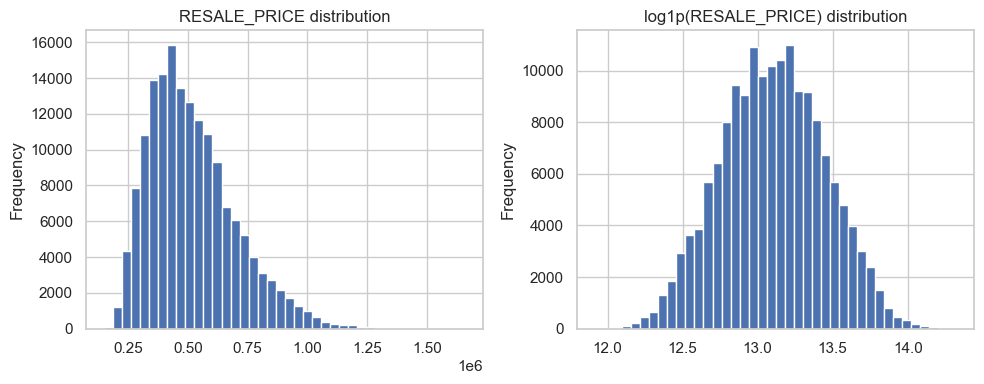

In [169]:
# --- EDA 2: Target distribution and log-transform check ---
import matplotlib.pyplot as plt

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
train_df['RESALE_PRICE'].plot(kind='hist', bins=40, title='RESALE_PRICE distribution')
plt.subplot(1,2,2)
np.log1p(train_df['RESALE_PRICE']).plot(kind='hist', bins=40, title='log1p(RESALE_PRICE) distribution')
plt.tight_layout(); plt.show()

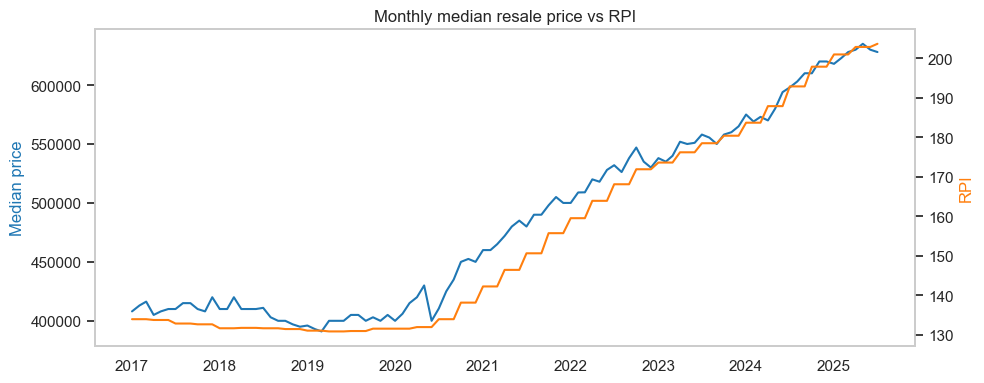

In [170]:
# --- EDA 3: Time trend vs RPI ---
# Aggregate median price by month, align with RPI
mtrain = train_df.copy()
mtrain['MONTH'] = pd.to_datetime(mtrain['MONTH'], format='%Y-%m', errors='coerce')
agg = mtrain.groupby('MONTH')['RESALE_PRICE'].median().reset_index(name='median_price')
rpi = mtrain.groupby('MONTH')['rpi'].median().reset_index(name='rpi')
plot_df = agg.merge(rpi, on='MONTH', how='left').sort_values('MONTH')

fig, ax1 = plt.subplots(figsize=(10,4))
ax1.plot(plot_df['MONTH'], plot_df['median_price'], color='tab:blue', label='Median Price')
ax1.set_ylabel('Median price', color='tab:blue')
ax2 = ax1.twinx()
ax2.plot(plot_df['MONTH'], plot_df['rpi'], color='tab:orange', label='RPI')
ax2.set_ylabel('RPI', color='tab:orange')
ax1.set_title('Monthly median resale price vs RPI')

# Turn off grid lines on both axes
ax1.grid(False)
ax2.grid(False)

fig.tight_layout(); plt.show()

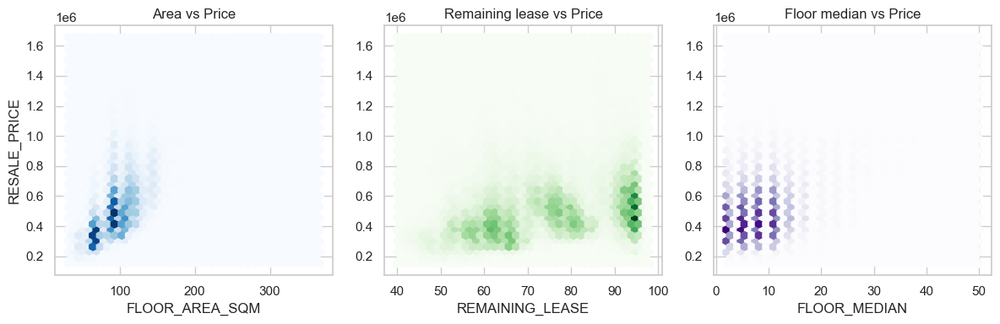

In [171]:
# --- EDA 4: Numeric relationships (scatter/hexbin) ---
import pandas as pd
import numpy as np

# Build local Series for engineered features (robust to column name variants)
sale_year = pd.to_datetime(train_df['MONTH'], format='%Y-%m', errors='coerce').dt.year
lease_col = 'LEASE_COMMENCE_DATE' if 'LEASE_COMMENCE_DATE' in train_df.columns else 'LEASE_COMMENCE_DATA'
lease_year = pd.to_numeric(train_df[lease_col], errors='coerce')
remaining_lease = (99 - (sale_year - lease_year)).clip(lower=0)

# Use existing FLOOR_MEDIAN if present; else derive from FLOOR_RANGE
if 'FLOOR_MEDIAN' in train_df.columns:
    floor_median = pd.to_numeric(train_df['FLOOR_MEDIAN'], errors='coerce')
else:
    floor_bounds = train_df['FLOOR_RANGE'].astype(str).str.extract(r'(\d+)\s*to\s*(\d+)').astype(float)
    floor_median = floor_bounds.mean(axis=1)

plt.figure(figsize=(12,4))

plt.subplot(1,3,1)
plt.hexbin(train_df['FLOOR_AREA_SQM'], train_df['RESALE_PRICE'], gridsize=35, cmap='Blues')
plt.xlabel('FLOOR_AREA_SQM'); plt.ylabel('RESALE_PRICE'); plt.title('Area vs Price')

plt.subplot(1,3,2)
mask2 = remaining_lease.notna() & train_df['RESALE_PRICE'].notna()
plt.hexbin(remaining_lease[mask2], train_df['RESALE_PRICE'][mask2], gridsize=35, cmap='Greens')
plt.xlabel('REMAINING_LEASE'); plt.title('Remaining lease vs Price')

plt.subplot(1,3,3)
mask3 = floor_median.notna() & train_df['RESALE_PRICE'].notna()
plt.hexbin(floor_median[mask3], train_df['RESALE_PRICE'][mask3], gridsize=35, cmap='Purples')
plt.xlabel('FLOOR_MEDIAN'); plt.title('Floor median vs Price')

plt.tight_layout(); plt.show()

<Figure size 1000x400 with 0 Axes>

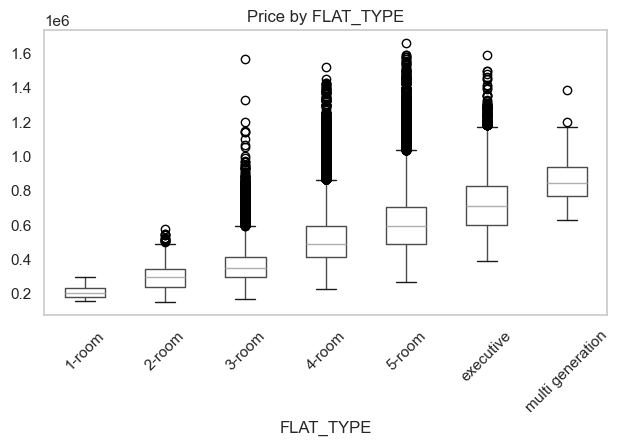

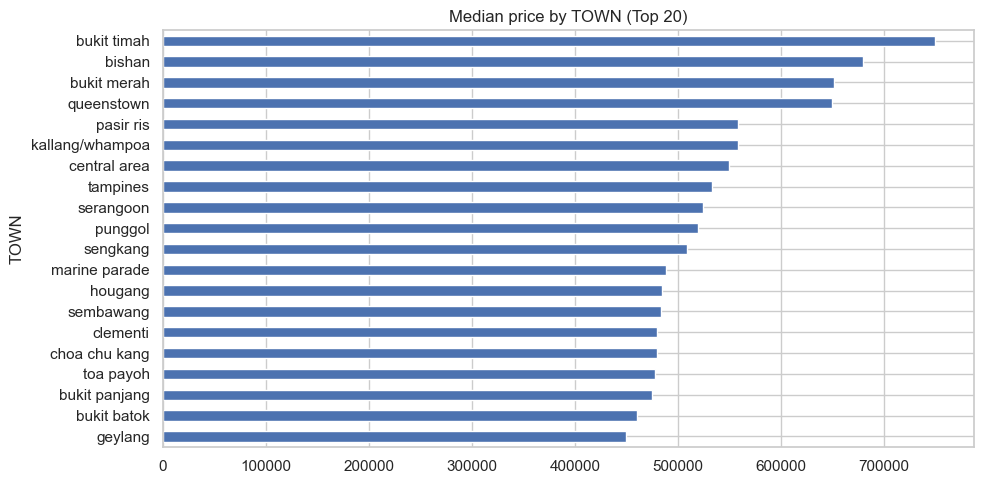

In [172]:
# --- EDA 5: Group effects by FLAT_TYPE and TOWN ---
# Boxplot by FLAT_TYPE
plt.figure(figsize=(10,4))
order = train_df['FLAT_TYPE'].value_counts().index.tolist()
train_df.boxplot(column='RESALE_PRICE', by='FLAT_TYPE', grid=False)
plt.suptitle(''); plt.title('Price by FLAT_TYPE'); plt.xticks(rotation=45); plt.tight_layout(); plt.show()

# Median price by TOWN (top 20 by count)
town_stats = (train_df.groupby('TOWN')['RESALE_PRICE']
              .median().sort_values(ascending=False))
plt.figure(figsize=(10,5))
town_stats.head(20).iloc[::-1].plot(kind='barh')
plt.title('Median price by TOWN (Top 20)'); plt.tight_layout(); plt.show()

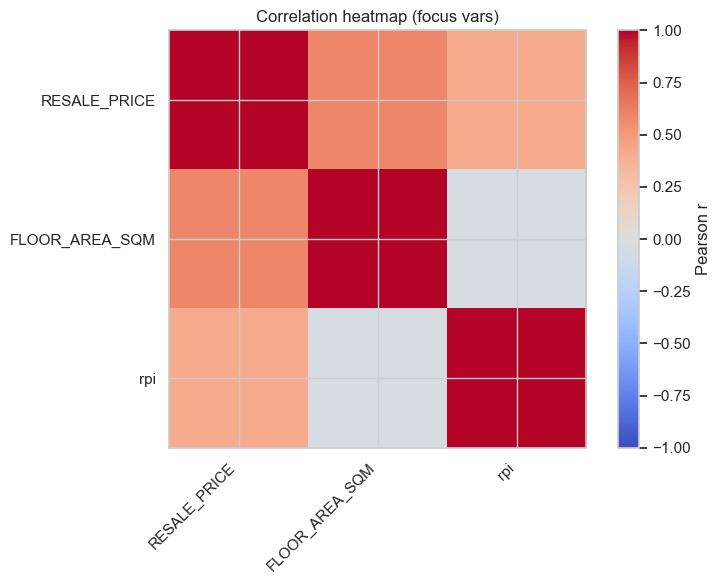

In [173]:
# --- EDA 6: Correlation heatmap (numeric only) ---
num_cols = train_df.select_dtypes(include=[np.number]).columns.tolist()
# Avoid leakage by excluding target when computing feature-feature correlation matrix for narrative
corr = train_df[num_cols].corr()

# Reorder a subset for readability
focus = [c for c in ['RESALE_PRICE','FLOOR_AREA_SQM','REMAINING_LEASE','BLOCK_NUM','rpi','MONTH_IDX','FLOOR_MEDIAN','ROOMS','AREA_PER_ROOM'] if c in corr.columns]
subset = corr.loc[focus, focus]

plt.figure(figsize=(8,6))
plt.imshow(subset, cmap='coolwarm', vmin=-1, vmax=1)
plt.colorbar(label='Pearson r')
plt.xticks(range(len(subset.columns)), subset.columns, rotation=45, ha='right')
plt.yticks(range(len(subset.index)), subset.index)
plt.title('Correlation heatmap (focus vars)')
plt.tight_layout(); plt.show()

In [174]:
# Geospatial coverage: plot all locations on a map using folium
import folium
from folium.plugins import MarkerCluster

# Center map on Singapore
m = folium.Map(location=[1.3521, 103.8198], zoom_start=11)

# Helper to add points
def add_points(df, lat_col, lon_col, color, name):
    cluster = MarkerCluster(name=name)
    for _, row in df.dropna(subset=[lat_col, lon_col]).iterrows():
        folium.CircleMarker(
            location=[row[lat_col], row[lon_col]],
            radius=2,
            color=color,
            fill=True,
            fill_opacity=0.6,
            popup=name
        ).add_to(cluster)
    cluster.add_to(m)

add_points(hdb_block_details_df, 'LATITUDE', 'LONGITUDE', 'blue', 'HDB Blocks')
add_points(mrt_stations_df, 'LATITUDE', 'LONGITUDE', 'red', 'MRT Stations')
add_points(primary_schools_df, 'LATITUDE', 'LONGITUDE', 'green', 'Primary Schools')
add_points(secondary_schools_df, 'LATITUDE', 'LONGITUDE', 'purple', 'Secondary Schools')
add_points(shopping_malls_df, 'LATITUDE', 'LONGITUDE', 'orange', 'Shopping Malls')
add_points(hawkers_df, 'LATITUDE', 'LONGITUDE', 'brown', 'Hawkers')

folium.LayerControl().add_to(m)

legend_html = '''
<div style="
    position: fixed; 
    bottom: 50px; left: 50px; width: 200px; z-index:9999; font-size:14px;
    background-color: white; border:2px solid grey; border-radius:6px; padding: 10px;">
<b>Legend</b><br>
<span style="color:blue;">&#9679;</span> HDB Blocks<br>
<span style="color:red;">&#9679;</span> MRT Stations<br>
<span style="color:green;">&#9679;</span> Primary Schools<br>
<span style="color:purple;">&#9679;</span> Secondary Schools<br>
<span style="color:orange;">&#9679;</span> Shopping Malls<br>
<span style="color:brown;">&#9679;</span> Hawkers
</div>
'''
m.get_root().html.add_child(folium.Element(legend_html))

# Display the map
m

<a id="s06" class="anchor-offset"></a>
<a id="s6" class="anchor-offset"></a>
## 6. Baseline Modeling

We establish a fast, numeric-only Random Forest baseline on the cleaned, pre–feature-engineering data (FLOOR_AREA_SQM, LEASE_COMMENCE_DATE, rpi, MAX_FLOOR), using median imputation and an 80/20 holdout (no tuning). We report RMSE and importances to set a clear benchmark; an optional variant adds one‑hot for a few low‑cardinality categoricals to gauge uplift.


BASELINE RANDOM FOREST (Raw Features Only)
Features used: ['FLOOR_AREA_SQM', 'LEASE_COMMENCE_DATE', 'rpi', 'MAX_FLOOR']
Number of features: 4
Validation RMSE: 61,036.14
Mean Absolute Error: 41,332.82


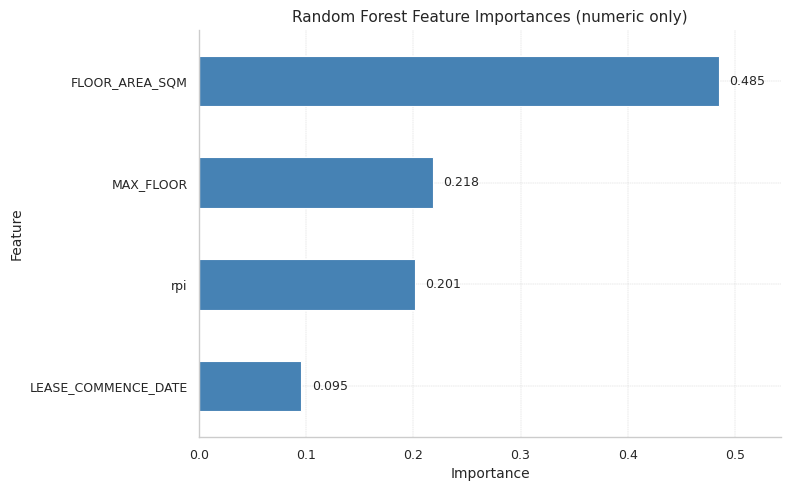


Key Insights for Feature Engineering:
1. Most important raw feature: LEASE_COMMENCE_DATE (0.095)
2. Baseline RMSE: 61,036.14
3. This establishes our benchmark before feature engineering.


In [235]:
# ====================================================================================
# STEP 6 — Baseline Model: Random Forest (Pre-Feature Engineering)
# ====================================================================================

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Use ONLY raw numeric features available immediately after data cleaning
rf_features = [
    'FLOOR_AREA_SQM',      # ✅ Raw feature from original data
    'LEASE_COMMENCE_DATE', # ✅ Raw feature (year when lease started)
    'rpi',                 # ✅ Added earlier (RPI merge)
    'MAX_FLOOR'            # ✅ From auxiliary data merge
]

# Verify all features exist (some might be missing in test set)
rf_features = [f for f in rf_features if f in train_df.columns]

X_rf = train_df[rf_features].copy()
y_rf = train_df['RESALE_PRICE'].copy()

# Handle missing values conservatively (median imputation)
X_rf = X_rf.fillna(X_rf.median(numeric_only=True))

# Simple 80/20 holdout split (simple CV only - this is just a baseline!)
X_tr, X_va, y_tr, y_va = train_test_split(X_rf, y_rf, test_size=0.2, random_state=42)

# Train baseline Random Forest (no hyperparameter tuning)
rf = RandomForestRegressor(n_estimators=300, random_state=42, n_jobs=-1)
rf.fit(X_tr, y_tr)
va_pred = rf.predict(X_va)
rf_rmse = float(np.sqrt(mean_squared_error(y_va, va_pred)))

print("="*70)
print("BASELINE RANDOM FOREST (Raw Features Only)")
print("="*70)
print(f"Features used: {rf_features}")
print(f"Number of features: {len(rf_features)}")
print(f"Validation RMSE: {rf_rmse:,.2f}")
print(f"Mean Absolute Error: {np.mean(np.abs(y_va - va_pred)):,.2f}")
print("="*70)

imp = pd.Series(rf.feature_importances_, index=X_rf.columns).sort_values(ascending=True)

plt.figure(figsize=(8, 5))
ax = imp.plot(kind='barh', color='steelblue')
ax.set_title('Random Forest Feature Importances (numeric only)')
ax.set_xlabel('Importance')
ax.set_ylabel('Feature')

# Add value labels at the end of each bar
xmax = float(imp.max())
for y, v in enumerate(imp.values):
    ax.text(v + xmax * 0.02, y, f'{v:.3f}', va='center', fontsize=9)

# Add a little headroom so labels don’t get cut off
ax.set_xlim(0, xmax * 1.12)

plt.tight_layout()
plt.show()

print("\nKey Insights for Feature Engineering:")
print(f"1. Most important raw feature: {importances.index[0]} ({importances.iloc[0]:.3f})")
print(f"2. Baseline RMSE: {rf_rmse:,.2f}")
print("3. This establishes our benchmark before feature engineering.")

In [176]:
# --- Optional: Baseline + simple categoricals (one-hot, low-cardinality only) ---
# Rationale: keep it "pre-feature-engineering" by only one-hot encoding a few low-cardinality
# categoricals (e.g., TOWN, FLAT_TYPE, FLAT_MODEL, FLOOR_RANGE). Avoid high-cardinality columns
# like STREET/BLOCK to prevent huge sparse matrices in the baseline.

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

max_cardinality = 30  # change if you want to allow more categories

# Identify candidate categoricals present in the data
candidate_cats = [c for c in ['TOWN','FLAT_TYPE','FLAT_MODEL','FLOOR_RANGE','MONTH'] if c in train_df.columns]
low_card_cats = [c for c in candidate_cats if train_df[c].nunique(dropna=False) <= max_cardinality]

# One-hot encode only the low-cardinality set
X_ohe = pd.get_dummies(train_df[low_card_cats], drop_first=True, dtype='uint8') if low_card_cats else pd.DataFrame(index=train_df.index)

# Combine with numeric baseline features
X_base = train_df[[f for f in ['FLOOR_AREA_SQM','LEASE_COMMENCE_DATE','rpi','MAX_FLOOR'] if f in train_df.columns]].copy()
X_all = pd.concat([X_base, X_ohe], axis=1)
X_all = X_all.fillna(X_all.median(numeric_only=True))
y_all = train_df['RESALE_PRICE']

# Use the same split seed for a fair comparison
X_tr2, X_va2, y_tr2, y_va2 = train_test_split(X_all, y_all, test_size=0.2, random_state=42)

rf2 = RandomForestRegressor(n_estimators=300, random_state=42, n_jobs=-1)
rf2.fit(X_tr2, y_tr2)
va_pred2 = rf2.predict(X_va2)
rmse2 = float(((y_va2 - va_pred2)**2).mean()**0.5)

print("\n=== Baseline + categoricals (one-hot) ===")
print("Low-cardinality categoricals used:", low_card_cats)
print("X shape:", X_all.shape)
print(f"Validation RMSE: {rmse2:,.2f}")
print("Delta vs numeric-only:", f"{rmse2 - rf_rmse:+,.2f}")


=== Baseline + categoricals (one-hot) ===
Low-cardinality categoricals used: ['TOWN', 'FLAT_TYPE', 'FLAT_MODEL', 'FLOOR_RANGE']
X shape: (162464, 71)
Validation RMSE: 36,795.99
Delta vs numeric-only: -24,240.15



Top 30 raw feature importances (including one-hot columns):
FLOOR_AREA_SQM                           0.429222
rpi                                      0.180098
MAX_FLOOR                                0.172880
LEASE_COMMENCE_DATE                      0.053595
TOWN_bishan                              0.013737
FLAT_MODEL_model a                       0.010705
TOWN_bukit merah                         0.010349
TOWN_bukit panjang                       0.009113
TOWN_woodlands                           0.008233
TOWN_geylang                             0.008095
TOWN_kallang/whampoa                     0.007380
TOWN_choa chu kang                       0.006207
TOWN_toa payoh                           0.006185
FLAT_MODEL_dbss                          0.005977
TOWN_queenstown                          0.005662
TOWN_jurong east                         0.005528
TOWN_bukit timah                         0.005263
TOWN_jurong west                         0.005172
TOWN_bedok                             

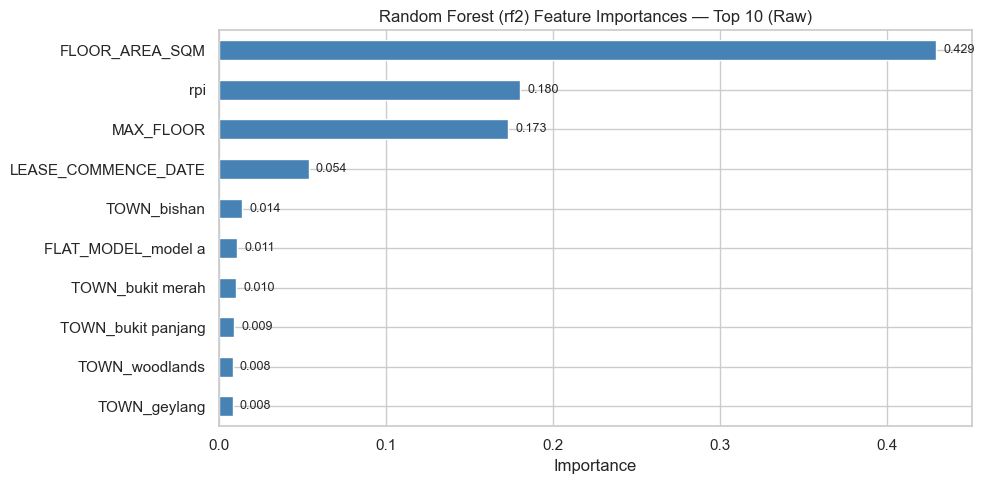


Grouped importances by family (baseline numerics + categorical families):
FLOOR_AREA_SQM       0.429222
rpi                  0.180098
MAX_FLOOR            0.172880
TOWN                 0.123077
LEASE_COMMENCE_DATE  0.053595
FLAT_MODEL           0.022470
FLOOR_RANGE          0.014822
FLAT_TYPE            0.003835

Sanity checks:
 - Sum raw: 0.9999999999999998 | Sum grouped: 0.9999999999999999
 - FLAT_TYPE: 0.003834517373212063
 - FLAT_MODEL: 0.02247042900160054
 - FLOOR_RANGE: 0.014822192946553486


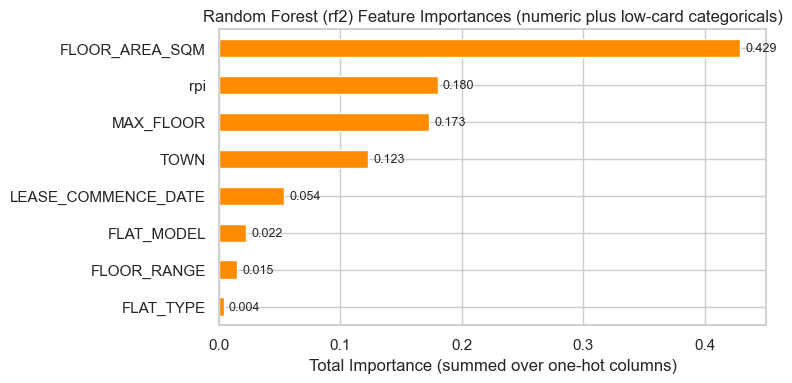

In [209]:
# Feature importance for rf2 trained on X_all (improved grouping + plots)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 1) Raw feature importances (per column, including one-hot columns)
imp_raw = pd.Series(rf2.feature_importances_, index=X_all.columns).sort_values(ascending=False)

print("\nTop 30 raw feature importances (including one-hot columns):")
for feat, val in imp_raw.head(30).items():
    print(f"{feat:<40s} {val:.6f}")

# Plot top-N raw features (largest at top)
TOP_N = 10
imp_top = imp_raw.head(TOP_N).sort_values(ascending=True)  # small→bottom, large→top
plt.figure(figsize=(10, max(5, TOP_N * 0.32)))
ax = imp_top.plot(kind='barh', color='steelblue')
ax.set_title(f'Random Forest (rf2) Feature Importances — Top {TOP_N} (Raw)')
ax.set_xlabel('Importance')
# Optional value labels
for i, v in enumerate(imp_top.values):
    ax.text(v + imp_top.max()*0.01, i, f'{v:.3f}', va='center', fontsize=9)
plt.tight_layout()
plt.show()

# 2) Grouped importances by original feature family
#    - Numeric baseline features stay as-is.
#    - Categorical one-hot columns are grouped to their family (e.g., TOWN, FLAT_TYPE).
baseline_numeric = {'FLOOR_AREA_SQM', 'LEASE_COMMENCE_DATE', 'rpi', 'MAX_FLOOR'}
known_families = ["TOWN", "FLAT_TYPE", "FLAT_MODEL", "FLOOR_RANGE", "MONTH"]

def family_name(col: str) -> str:
    # Keep numeric baselines as-is
    if col in baseline_numeric:
        return col
    # If OHE used a safe separator like '=', e.g. 'FLAT_TYPE=4-room'
    if '=' in col:
        return col.split('=', 1)[0]
    # Default OHE (e.g., 'FLAT_TYPE_4-room') — match families explicitly
    for fam in known_families:
        if col.startswith(fam + '_'):
            return fam
    # Fallback: if column starts with a known family even without underscore separation
    for fam in known_families:
        if col.startswith(fam):
            return fam
    # Otherwise, return as-is (rare)
    return col

imp_grouped = imp_raw.groupby(imp_raw.index.map(family_name)).sum().sort_values(ascending=False)

print("\nGrouped importances by family (baseline numerics + categorical families):")
for fam, val in imp_grouped.items():
    print(f"{fam:<20s} {val:.6f}")

# Quick checks
print("\nSanity checks:")
print(" - Sum raw:", float(imp_raw.sum()), "| Sum grouped:", float(imp_grouped.sum()))
print(" - FLAT_TYPE:", float(imp_grouped.get("FLAT_TYPE", 0.0)))
print(" - FLAT_MODEL:", float(imp_grouped.get("FLAT_MODEL", 0.0)))
print(" - FLOOR_RANGE:", float(imp_grouped.get("FLOOR_RANGE", 0.0)))
if "FLAT" in imp_grouped.index or "FLOOR" in imp_grouped.index:
    print("WARNING: Detected unintended broad groups like 'FLAT' or 'FLOOR'. "
          "Ensure grouping logic above is used, or re-encode with prefix_sep='='.")

# Plot top groups (largest at top)
TOP_G = 10
grp_top = imp_grouped.head(TOP_G).sort_values(ascending=True)
plt.figure(figsize=(8, max(4, TOP_G * 0.35)))
ax = grp_top.plot(kind='barh', color='darkorange')
ax.set_title(f'Random Forest (rf2) Feature Importances (numeric plus low-card categoricals)')
ax.set_xlabel('Total Importance (summed over one-hot columns)')
for i, v in enumerate(grp_top.values):
    ax.text(v + grp_top.max()*0.01, i, f'{v:.3f}', va='center', fontsize=9)
plt.tight_layout()
plt.show()

# Optional: export to CSVs
# imp_raw.to_csv("rf2_feature_importances_raw.csv")
# imp_grouped.to_csv("rf2_feature_importances_grouped.csv")

In [ ]:
# Charts used in EDA report (commented out to avoid execution here)
# def generate_eda_figures(train_df, images_dir="images", rpi_csv=None, top_n=None):
#     """
#     Generates all EDA figures (PNG) used in LaTeX.
#       target_price_distribution_v2.png
#       temporal_monthly_median_trend_v2.png
#       temporal_monthly_price_volatility_iqr_v2.png
#       monthly_resale_vs_rpi_indexed_v2.png
#       temporal_seasonal_effects_v2.png
#       flat_type_distribution_share_v2.png
#       area_vs_price_v2.png
#       floor_range_vs_price_v2.png            <-- Fig 8
#       transactions_per_town_v2.png           <-- Fig 9 (VERTICAL: Town on x)
#       average_price_per_town_ci_v2.png       <-- Fig 10 (VERTICAL lollipop + CI)
#       amenity_median_distance_v2.png         <-- Fig 11 (VERTICAL grouped bars)
#     """
#     # ------------------------- imports & style -------------------------
#     import os, numpy as np, pandas as pd
#     import matplotlib as mpl
#     import matplotlib.pyplot as plt
#     import seaborn as sns
#     from matplotlib.ticker import FuncFormatter

#     os.makedirs(images_dir, exist_ok=True)

#     sns.set_theme(style="whitegrid", context="paper")
#     base_rc = {
#         "figure.figsize": (6.8, 4.2),
#         "axes.titlesize": 11,
#         "axes.labelsize": 10,
#         "xtick.labelsize": 9,
#         "ytick.labelsize": 9,
#         "legend.fontsize": 9,
#         "axes.grid": True,
#         "grid.linestyle": "--",
#         "grid.linewidth": 0.3,
#         "axes.spines.top": False,
#         "axes.spines.right": False,
#         "font.family": "DejaVu Sans",
#     }
#     mpl.rcParams.update(base_rc)

#     def savefig(path):
#         plt.tight_layout()
#         plt.savefig(path, dpi=320, bbox_inches="tight")
#         plt.close()

#     def fmt_sgd_axis(ax, which="y"):
#         fmt = FuncFormatter(lambda v, pos: f"${int(v/1000)}k")
#         if which == "x": ax.xaxis.set_major_formatter(fmt)
#         else:            ax.yaxis.set_major_formatter(fmt)

#     # ------------------------- columns & helpers -------------------------
#     df = train_df.copy()
#     assert {"RESALE_PRICE","MONTH","TOWN"}.issubset(df.columns), "Expected columns missing"

#     df["MONTH_TS"] = pd.to_datetime(df["MONTH"], format="%Y-%m", errors="coerce")
#     df = df.dropna(subset=["MONTH_TS"])

#     if "FLOOR_RANGE" in df.columns:
#         def parse_floor_mid(s):
#             if not isinstance(s, str): return np.nan
#             s = s.upper().replace(" ", "")
#             if "TO" not in s:
#                 try: return float(s)
#                 except: return np.nan
#             a, b = s.split("TO", 1)
#             try: return (int(a) + int(b)) / 2.0
#             except: return np.nan
#         df["MID_FLOOR"] = df["FLOOR_RANGE"].apply(parse_floor_mid)

#     def fd_bins(x):
#         x = pd.Series(x).dropna().values
#         if len(x) < 2: return 10
#         iqr = np.subtract(*np.percentile(x, [75, 25]))
#         h = 2 * iqr * (len(x) ** (-1/3)) if iqr > 0 else (np.std(x) * (len(x) ** (-1/3)))
#         if not np.isfinite(h) or h <= 0: return 50
#         k = int(np.ceil((x.max() - x.min()) / h))
#         return max(20, min(120, k))

#     rng = np.random.default_rng(42)
#     def boot_ci(x, stat="median", B=600, alpha=0.05):
#         x = np.asarray(pd.Series(x).dropna().values)
#         if len(x) == 0: return (np.nan, np.nan)
#         idx = rng.integers(0, len(x), size=(B, len(x)))
#         vals = np.median(x[idx], axis=1) if stat == "median" else x[idx].mean(axis=1)
#         lo, hi = np.quantile(vals, [alpha/2, 1-alpha/2])
#         return float(lo), float(hi)

#     # ---------- 1) Price distribution ----------
#     x = df["RESALE_PRICE"].dropna()
#     fig, ax = plt.subplots()
#     bins = fd_bins(x)
#     sns.histplot(x=x, bins=bins, kde=True, ax=ax)
#     ax.set_title("HDB Resale Price Distribution")
#     ax.set_xlabel("Resale price (SGD)"); ax.set_ylabel("Count")
#     med = float(np.median(x)); q1, q3 = np.quantile(x, [0.25, 0.75])
#     for v, label in [(med, "median"), (q1, "Q1"), (q3, "Q3")]:
#         ax.axvline(v, ls="--", lw=1, label=label)
#     ax.text(0.98, 0.95, f"n={len(x):,}\nmedian={med/1000:.0f}k\nIQR={q1/1000:.0f}–{q3/1000:.0f}k",
#             transform=ax.transAxes, ha="right", va="top", fontsize=8, color="0.25")
#     fmt_sgd_axis(ax, "x"); ax.legend()
#     savefig(os.path.join(images_dir, "target_price_distribution_v2.png"))

#     # ---------- 2) Monthly median + CI + SMA ----------
#     m = (df.groupby("MONTH_TS")["RESALE_PRICE"]
#            .agg(["median","mean","std","count"])
#            .sort_index()
#            .dropna())
#     ci = m.index.to_series().apply(
#         lambda t: pd.Series(boot_ci(df.loc[df["MONTH_TS"] == t, "RESALE_PRICE"], stat="median"),
#                             index=["lo","hi"])
#     )
#     m = m.join(ci)
#     fig, ax = plt.subplots()
#     sns.lineplot(x=m.index, y=m["median"], lw=1.6, ax=ax, label="Monthly median")
#     ax.fill_between(m.index, m["lo"], m["hi"], alpha=0.20, label="95% CI")
#     ax.plot(m.index, m["median"].rolling(12, min_periods=3).mean(), lw=2.0, ls="-.", label="12-mo SMA")
#     start_med, end_med = m["median"].iloc[0], m["median"].iloc[-1]
#     delta_pct = 100 * (end_med / start_med - 1)
#     ax.text(m.index[-1], end_med, f"  Δ≈{delta_pct:.1f}% since {m.index[0].year}",
#             va="center", ha="left", fontsize=8, color="0.25")
#     ax.set_title("Monthly Median Resale Prices")
#     ax.set_xlabel("Month"); ax.set_ylabel("Price (SGD)")
#     fmt_sgd_axis(ax, "y"); ax.legend()
#     savefig(os.path.join(images_dir, "temporal_monthly_median_trend_v2.png"))

#     # ---------- 3) Volatility: monthly IQR ----------
#     g = df.groupby("MONTH_TS")["RESALE_PRICE"]
#     vol = pd.DataFrame({"p75": g.quantile(0.75), "p25": g.quantile(0.25)}).dropna()
#     vol["IQR"] = vol["p75"] - vol["p25"]
#     fig, ax = plt.subplots()
#     sns.lineplot(x=vol.index, y=vol["IQR"], lw=1.6, ax=ax)
#     ax.set_title("Monthly Resale Price Volatility (IQR)")
#     ax.set_xlabel("Month"); ax.set_ylabel("IQR (SGD)")
#     fmt_sgd_axis(ax, "y")
#     savefig(os.path.join(images_dir, "temporal_monthly_price_volatility_iqr_v2.png"))

#     # ---------- 4) Resale vs RPI ----------
#     have_rpi_col = "rpi" in df.columns
#     if have_rpi_col or (rpi_csv and os.path.exists(rpi_csv)):
#         if not have_rpi_col:
#             rpi = pd.read_csv(rpi_csv)
#             rpi.columns = [c.lower() for c in rpi.columns]
#             rpi["MONTH_TS"] = pd.to_datetime(rpi["month"], errors="coerce").dt.to_period("M").dt.to_timestamp()
#             comp = pd.DataFrame({"resale_med": m["median"]}).join(rpi.set_index("MONTH_TS")["rpi"], how="inner").dropna()
#         else:
#             comp = (pd.DataFrame({"resale_med": m["median"]})
#                       .join(df.set_index("MONTH_TS")["rpi"], how="inner")
#                       .dropna()
#                       .groupby(level=0).mean())
#         def index100(s): s = s.dropna(); return 100*s / s.iloc[0]
#         zp = (comp["resale_med"] - comp["resale_med"].mean())/comp["resale_med"].std(ddof=1)
#         zr = (comp["rpi"]        - comp["rpi"].mean())       /comp["rpi"].std(ddof=1)
#         r  = float(np.corrcoef(zp, zr)[0,1])
#         lags = range(-12, 13)
#         scores=[]
#         for L in lags:
#             if L < 0:  scores.append(np.corrcoef(zp[-L:], zr[:len(zr)+L])[0,1])
#             elif L>0:  scores.append(np.corrcoef(zp[:-L], zr[L:])[0,1])
#             else:      scores.append(np.corrcoef(zp, zr)[0,1])
#         best_lag = int(lags[int(np.nanargmax(scores))]); best_val = float(np.nanmax(scores))
#         fig, ax = plt.subplots()
#         sns.lineplot(x=comp.index, y=index100(comp["resale_med"]), ax=ax, label="Resale (index=100)")
#         sns.lineplot(x=comp.index, y=index100(comp["rpi"]),        ax=ax, label="RPI (index=100)")
#         ax.set_title(f"Monthly Resale vs RPI (r={r:.2f}, best lag {best_lag} mo: {best_val:.2f})")
#         ax.set_xlabel("Month"); ax.set_ylabel("Index")
#         ax.legend()
#         savefig(os.path.join(images_dir, "monthly_resale_vs_rpi_indexed_v2.png"))

#     # ---------- 5) Seasonality after detrending ----------
#     trend = m["median"].rolling(12, min_periods=6, center=True).median()
#     detrended = (m["median"] - trend).dropna()
#     season = detrended.groupby(detrended.index.month).agg(["mean","count","std"])
#     season["se"] = season["std"] / np.sqrt(season["count"].clip(lower=1))
#     season["lo"] = season["mean"] - 1.96*season["se"]
#     season["hi"] = season["mean"] + 1.96*season["se"]
#     groups = [g.values for _, g in detrended.groupby(detrended.index.month)]
#     vals = detrended.values; grand = vals.mean(); k = len(groups); n_tot = sum(len(g) for g in groups)
#     ss_b = sum(len(g)*(g.mean()-grand)**2 for g in groups); ss_w = sum(((g - g.mean())**2).sum() for g in groups)
#     F = (ss_b/(k-1)) / (ss_w/(n_tot-k)) if (k>1 and n_tot>k and ss_w>0) else np.nan
#     eta2 = ss_b / (ss_b + ss_w) if (ss_b+ss_w)>0 else np.nan
#     fig, ax = plt.subplots()
#     mm = np.arange(1, 13)
#     ax.plot(mm, season["mean"], marker="o")
#     ax.fill_between(mm, season["lo"], season["hi"], alpha=0.20)
#     ax.set_xticks(mm); ax.set_xlabel("Month"); ax.set_ylabel("Detrended mean (SGD)")
#     ax.set_title(f"Month-of-year effect after detrending (F={F:.2f}, η²={eta2:.3f})")
#     fmt_sgd_axis(ax, "y")
#     savefig(os.path.join(images_dir, "temporal_seasonal_effects_v2.png"))

#     # ---------- 6) Flat type distribution ----------
#     if "FLAT_TYPE" in df.columns:
#         fc = df["FLAT_TYPE"].value_counts(dropna=False)
#         share = (100 * fc / fc.sum()).round(1)
#         flat_df = fc.rename_axis("FLAT_TYPE").reset_index(name="n")
#         fig, ax = plt.subplots()
#         sns.barplot(data=flat_df, x="FLAT_TYPE", y="n",
#                     hue="FLAT_TYPE", palette="tab20", legend=False, ax=ax)
#         ax.set_title("Flat Type Distribution"); ax.set_xlabel("Flat type"); ax.set_ylabel("Transactions")
#         for p, pct in zip(ax.patches, share.values):
#             ax.text(p.get_x()+p.get_width()/2, p.get_height()*1.01, f"{pct:.1f}%",
#                     ha="center", va="bottom", fontsize=8)
#         plt.xticks(rotation=45, ha="right")
#         savefig(os.path.join(images_dir, "flat_type_distribution_share_v2.png"))

#     # ---------- 7) Area vs price (deciles: median + IQR) ----------
#     if {"FLOOR_AREA_SQM","RESALE_PRICE"}.issubset(df.columns):
#         area = df[["FLOOR_AREA_SQM","RESALE_PRICE"]].dropna().copy()
#         if len(area) > 0:
#             area["decile"] = pd.qcut(area["FLOOR_AREA_SQM"], 10, duplicates="drop")
#             g = area.groupby("decile", observed=True)["RESALE_PRICE"]
#             med = g.median(); p25 = g.quantile(0.25); p75 = g.quantile(0.75)
#             rho = area["FLOOR_AREA_SQM"].corr(area["RESALE_PRICE"], method="spearman")
#             x_d = np.arange(len(med))
#             labels = [f"{int(i.left)}–{int(i.right)}" if hasattr(i, "left") else str(i) for i in med.index]
#             fig, ax = plt.subplots()
#             ax.plot(x_d, med.values, marker="o", lw=1.8, label="Median")
#             ax.fill_between(x_d, p25.values, p75.values, alpha=0.2, label="IQR")
#             ax.set_xticks(x_d); ax.set_xticklabels(labels, rotation=45, ha="right")
#             ax.set_title(f"Floor area vs resale price (decile median with IQR) — Spearman ρ={rho:.2f}")
#             ax.set_xlabel("Floor area (sqm, deciles)"); ax.set_ylabel("Price (SGD)")
#             fmt_sgd_axis(ax, "y"); ax.legend()
#             savefig(os.path.join(images_dir, "area_vs_price_v2.png"))

#     # ---------- 8) Floor range vs price (town-adjusted mean ±95% CI) [Fig 8] ----------
#     if {"FLOOR_RANGE","MID_FLOOR","RESALE_PRICE","TOWN"}.issubset(df.columns):
#         adj = df["RESALE_PRICE"] - df.groupby("TOWN")["RESALE_PRICE"].transform("mean")
#         fr = pd.DataFrame({"FLOOR_RANGE": df["FLOOR_RANGE"], "adj_price": adj, "MID_FLOOR": df["MID_FLOOR"]}).dropna()
#         if len(fr) > 0:
#             grp = (fr.groupby(["FLOOR_RANGE","MID_FLOOR"], observed=True)["adj_price"]
#                      .agg(mean="mean", std="std", count="count")
#                      .reset_index()
#                      .sort_values("MID_FLOOR"))
#             grp["se"] = grp["std"] / np.sqrt(grp["count"].clip(lower=1))
#             grp["lo"] = grp["mean"] - 1.96*grp["se"]
#             grp["hi"] = grp["mean"] + 1.96*grp["se"]
#             with mpl.rc_context({"axes.titlesize": 12, "axes.labelsize": 11, "xtick.labelsize": 10, "ytick.labelsize": 10}):
#                 fig, ax = plt.subplots()
#                 x_f = np.arange(len(grp))
#                 ax.errorbar(x_f, grp["mean"], yerr=[grp["mean"]-grp["lo"], grp["hi"]-grp["mean"]],
#                             fmt="o-", capsize=3, lw=1.6, ms=5)
#                 ax.set_xticks(x_f); ax.set_xticklabels(grp["FLOOR_RANGE"].astype(str), rotation=45, ha="right")
#                 ax.set_title("Price by floor range (town-adjusted mean ± 95% CI)")
#                 ax.set_xlabel("Floor range"); ax.set_ylabel("Δ price vs town mean (SGD)")
#                 for xi, yi, n in zip(x_f, grp["mean"].values, grp["count"].values):
#                     ax.text(xi, yi, f" n={int(n)}", ha="left", va="bottom", fontsize=8)
#                 fmt_sgd_axis(ax, "y")
#                 savefig(os.path.join(images_dir, "floor_range_vs_price_v2.png"))

#     # ---------- 9) Transactions per town [Fig 9 — VERTICAL] ----------
#     txn = df["TOWN"].value_counts()
#     txn = (txn.sort_values(ascending=False).head(top_n)
#            if top_n else txn).sort_values(ascending=False)
#     txn_df = txn.rename_axis("TOWN").reset_index(name="n")
#     with mpl.rc_context({"axes.titlesize": 12, "axes.labelsize": 11, "xtick.labelsize": 10, "ytick.labelsize": 10}):
#         # dynamic width so town labels fit
#         fig_w = max(8.5, 0.30 * len(txn_df) + 2.5)
#         fig, ax = plt.subplots(figsize=(fig_w, 5.2))
#         sns.barplot(data=txn_df, x="TOWN", y="n",
#                     hue="TOWN", palette="tab20", legend=False, ax=ax, orient="v")
#         ax.set_title("Transactions per town")
#         ax.set_xlabel("Town"); ax.set_ylabel("Transactions")
#         ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
#         for p, n in zip(ax.patches, txn_df["n"]):
#             ax.text(p.get_x()+p.get_width()/2, p.get_height()*1.01,
#                     f"{int(n)}", ha="center", va="bottom", fontsize=9, color="0.35")
#         savefig(os.path.join(images_dir, "transactions_per_town_v2.png"))

#     # ---------- 10) Avg price per town (VERTICAL lollipop + CI) [Fig 10] ----------
#     def boot_ci_mean(x, B=600, alpha=0.05):
#         x = pd.Series(x).dropna().values
#         if len(x)==0: return (np.nan,np.nan)
#         idx = rng.integers(0, len(x), size=(B, len(x)))
#         vals = x[idx].mean(axis=1)
#         return float(np.quantile(vals, alpha/2)), float(np.quantile(vals, 1-alpha/2))

#     rows=[]
#     for t, s in df.groupby("TOWN")["RESALE_PRICE"]:
#         s = s.dropna()
#         if len(s)==0: continue
#         lo, hi = boot_ci_mean(s)
#         rows.append({"TOWN": t, "mean": float(s.mean()), "lo": lo, "hi": hi, "n": int(len(s))})
#     stats = pd.DataFrame(rows).sort_values("mean", ascending=True).reset_index(drop=True)
#     if top_n:
#         keep = set(txn_df["TOWN"]); stats = stats[stats["TOWN"].isin(keep)]

#     x_idx = np.arange(len(stats))
#     with mpl.rc_context({"axes.titlesize": 12, "axes.labelsize": 11, "xtick.labelsize": 10, "ytick.labelsize": 10}):
#         fig_w = max(8.7, 0.32 * len(stats) + 2.8)
#         fig, ax = plt.subplots(figsize=(fig_w, 5.6))
#         # CI as vertical lines
#         ax.vlines(x_idx, stats["lo"], stats["hi"], color="#9aa0a6", linewidth=2.2, zorder=1)
#         # Means as dots; size encodes sqrt(n)
#         sizes = np.clip(12 + 2.2*np.sqrt(stats["n"].values), 14, 72)
#         ax.scatter(x_idx, stats["mean"], s=sizes, color="#1f77b4", edgecolor="white", linewidth=0.7, zorder=2)
#         # Labels above points
#         for xi, yi in zip(x_idx, stats["mean"]):
#             ax.text(xi, yi, f"\n{int(round(yi/1000))}k", va="bottom", ha="center", fontsize=9, color="#1f2937")
#         ax.set_xticks(x_idx); ax.set_xticklabels(stats["TOWN"], rotation=45, ha="right")
#         ax.set_xlabel("Town"); ax.set_ylabel("Mean resale price (SGD)")
#         ax.set_title("Average resale price per town (95% bootstrap CI; dot size ∝ √n)")
#         fmt_sgd_axis(ax, "y")
#         savefig(os.path.join(images_dir, "average_price_per_town_ci_v2.png"))

#     # ---------- 11) Amenity proximity by town (VERTICAL grouped bars) [Fig 11] ----------
#     dist_cols = [c for c in df.columns if c.lower().startswith("distance_to_nearest_")]
#     if len(dist_cols) == 0:
#         print("No amenity-distance columns found (distance_to_nearest_*). Skipping amenity chart.")
#     else:
#         agg = df.groupby("TOWN")[dist_cols].median().reset_index()
#         if top_n:
#             towns_keep = (df["TOWN"].value_counts()
#                           .sort_values(ascending=False).head(top_n).index)
#             agg = agg[agg["TOWN"].isin(towns_keep)]
#         tidy = (agg.melt(id_vars="TOWN", var_name="amenity", value_name="median_km")
#                   .assign(amenity=lambda d: (d["amenity"]
#                       .str.replace("distance_to_nearest_", "", regex=False)
#                       .str.replace("_", " ").str.title())))
#         order = (agg.set_index("TOWN")[dist_cols].median(axis=1)
#                  .sort_values(ascending=True).index)
#         tidy = tidy.set_index("TOWN").loc[order].reset_index()
#         with mpl.rc_context({"axes.titlesize": 12, "axes.labelsize": 11, "xtick.labelsize": 10, "ytick.labelsize": 10, "legend.fontsize": 10}):
#             fig_w = max(8.7, 0.32 * len(order) + 3.0)
#             fig, ax = plt.subplots(figsize=(fig_w, 6.0))
#             sns.barplot(data=tidy, x="TOWN", y="median_km", hue="amenity",
#                         palette="Set2", orient="v", ax=ax, order=list(order))
#             ax.set_xlabel("Town")
#             ax.set_ylabel("Median distance (km)")
#             ax.set_title("Amenity proximity by town (median distance)")
#             ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
#             handles, labels = ax.get_legend_handles_labels()
#             ax.legend(handles, labels, title="Amenity",
#                       loc="upper left", bbox_to_anchor=(0.01, 0.99),
#                       bbox_transform=ax.transAxes, ncol=2, frameon=True, framealpha=0.9)
#             savefig(os.path.join(images_dir, "amenity_median_distance_v2.png"))

# generate_eda_figures(train_df, images_dir="images", rpi_csv=None, top_n=None)


/var/folders/j_/1jv8vcms5z32pv1h455d7g1w0000gn/T/ipykernel_92556/3341202448.py:263: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
/var/folders/j_/1jv8vcms5z32pv1h455d7g1w0000gn/T/ipykernel_92556/3341202448.py:330: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")


<a id="s07" class="anchor-offset"></a>
<a id="s7" class="anchor-offset"></a>
## 7. Feature Engineering

New features are created based on domain knowledge, including lease calculations, time features, proximity to amenities, and categorical interactions. These engineered features are expected to improve model accuracy.


In [ ]:
# ============================================================
# STEP 7 — Feature Engineering (motivated by RF + EDA insights)
# ============================================================

# Lease Features: Calculate flat age and remaining lease
def add_lease_features(df):
    yr = df["LEASE_COMMENCE_DATE"].astype("Int64")
    if "SALE_YEAR" not in df.columns:
        # Add time features if not already present
        dt = pd.to_datetime(df["MONTH"], format="%Y-%m", errors="coerce")
        df["SALE_YEAR"]  = dt.dt.year
    df["FLAT_AGE"] = df["SALE_YEAR"] - yr
    df["REMAINING_LEASE"] = 99 - df["FLAT_AGE"]
    return df

train_df = add_lease_features(train_df)
test_df  = add_lease_features(test_df)

# Time Features: Extract year, month, and create a month index
def add_time_features(df):
    dt = pd.to_datetime(df["MONTH"], format="%Y-%m", errors="coerce")
    df["SALE_YEAR"]  = dt.dt.year
    df["SALE_MONTH"] = dt.dt.month
    base = dt.min()
    df["MONTH_IDX"] = ((dt.dt.year - base.year) * 12 + (dt.dt.month - base.month)).astype("Int64")
    return df

train_df = add_time_features(train_df)
test_df  = add_time_features(test_df)

# Floor Features: Parse floor range into min, max, and median
def parse_floor_range(s):
    m = re.match(r"^\s*(\d{1,2})\s*to\s*(\d{1,2})\s*$", str(s))
    if not m:
        return np.nan, np.nan, np.nan
    lo = int(m.group(1)); hi = int(m.group(2))
    return lo, hi, (lo + hi) / 2.0

for df_ in (train_df, test_df):
    lo_hi_med = df_["FLOOR_RANGE"].apply(parse_floor_range)
    df_["FLOOR_MIN"]    = lo_hi_med.apply(lambda t: t[0])
    df_["FLOOR_MAX"]    = lo_hi_med.apply(lambda t: t[1])
    df_["FLOOR_MEDIAN"] = lo_hi_med.apply(lambda t: t[2])

# Room/Area Features: Extract number of rooms, executive flag, and area per room
def rooms_from_type(s):
    m = re.match(r"^(\d+)-room$", str(s))
    return int(m.group(1)) if m else np.nan

for df_ in (train_df, test_df):
    df_["ROOMS"] = df_["FLAT_TYPE"].apply(rooms_from_type)
    df_["IS_EXECUTIVE"] = (df_["FLAT_TYPE"] == "executive").astype(int)
    df_["AREA_PER_ROOM"] = df_["FLOOR_AREA_SQM"] / np.where(pd.notna(df_["ROOMS"]) & (df_["ROOMS"] > 0), df_["ROOMS"], np.nan)

# Block Features: Parse block number and suffix
def split_block(b):
    b = str(b)
    m = re.match(r"^(\d+)([a-z])?$", b)
    if not m: 
        return np.nan, 0
    num = int(m.group(1))
    has_suffix = 1 if m.group(2) else 0
    return num, has_suffix

for df_ in (train_df, test_df):
    vals = df_["BLOCK"].apply(split_block)
    df_["BLOCK_NUM"] = vals.apply(lambda t: t[0])
    df_["BLOCK_HAS_SUFFIX"] = vals.apply(lambda t: t[1])

# Frequency Encodings: Count frequency of STREET and BLOCK values
for col in ["STREET", "BLOCK"]:
    full = pd.concat([train_df[col], test_df[col]])
    counts = full.value_counts().astype(int)
    train_df[f"{col}_COUNT"] = train_df[col].map(counts)
    test_df[f"{col}_COUNT"]  = test_df[col].map(counts)

# Proximity Features: Compute distances to amenities using BallTree 
def add_essential_features(df, hawkers_df, mrt_stations_df, primary_schools_df, shopping_malls_df):
    """
    Add essential proximity features for HDB resale price prediction using tree-based models.
    """
    # Distance to nearest hawker centre
    hawker_coords = np.radians(hawkers_df[['LATITUDE', 'LONGITUDE']].values)
    tree = BallTree(hawker_coords, metric='haversine')
    hdb_coords = np.radians(df[['LATITUDE', 'LONGITUDE']].values)
    distances, _ = tree.query(hdb_coords, k=1)
    df['distance_to_nearest_hawker'] = distances[:, 0] * 6371  # Convert to km

    # Distance to nearest MRT (open stations only)
    open_mrt = mrt_stations_df[mrt_stations_df['STATUS'].str.lower() == 'open'].copy()
    mrt_coords = np.radians(open_mrt[['LATITUDE', 'LONGITUDE']].values)
    tree = BallTree(mrt_coords, metric='haversine')
    distances, _ = tree.query(hdb_coords, k=1)
    df['distance_to_nearest_mrt'] = distances[:, 0] * 6371

    # Distance to nearest primary school
    school_coords = np.radians(primary_schools_df[['LATITUDE', 'LONGITUDE']].values)
    tree = BallTree(school_coords, metric='haversine')
    distances, _ = tree.query(hdb_coords, k=1)
    df['distance_to_nearest_primary_school'] = distances[:, 0] * 6371

    # Distance to nearest shopping mall
    mall_coords = np.radians(shopping_malls_df[['LATITUDE', 'LONGITUDE']].values)
    tree = BallTree(mall_coords, metric='haversine')
    distances, _ = tree.query(hdb_coords, k=1)
    df['distance_to_nearest_mall'] = distances[:, 0] * 6371

    return df

train_df = add_essential_features(train_df, hawkers_df, mrt_stations_df, primary_schools_df, shopping_malls_df)
test_df = add_essential_features(test_df, hawkers_df, mrt_stations_df, primary_schools_df, shopping_malls_df)


# Categorical Codes: Encode FLAT_TYPE, TOWN, FLAT_MODEL as integer codes for interactions
train_df["FLAT_TYPE_CODE"] = train_df["FLAT_TYPE"].astype("category").cat.codes
test_df["FLAT_TYPE_CODE"] = test_df["FLAT_TYPE"].astype("category").cat.codes

train_df["TOWN_CODE"] = train_df["TOWN"].astype("category").cat.codes
test_df["TOWN_CODE"] = test_df["TOWN"].astype("category").cat.codes

train_df["FLAT_MODEL_CODE"] = train_df["FLAT_MODEL"].astype("category").cat.codes
test_df["FLAT_MODEL_CODE"] = test_df["FLAT_MODEL"].astype("category").cat.codes


# Create _cat columns for all BASE categoricals (for CatBoost)
cat_features_to_create = [
    "MONTH", "TOWN", "FLAT_TYPE", "BLOCK", "STREET", "FLOOR_RANGE", "FLAT_MODEL"
]
for col in cat_features_to_create:
    if col in train_df.columns:
        train_df[col + "_cat"] = train_df[col]
    if col in test_df.columns:
        test_df[col + "_cat"] = test_df[col]


# Numeric Interaction Features: Example - area × RPI 
train_df["FLOOR_AREA_X_RPI"] = train_df["FLOOR_AREA_SQM"] * train_df["rpi"]
test_df["FLOOR_AREA_X_RPI"] = test_df["FLOOR_AREA_SQM"] * test_df["rpi"]

# Categorical Interaction Features: Combine categoricals as strings
# Double interaction: TOWN × FLAT_TYPE
train_df["TOWN_X_FLAT_TYPE"] = train_df["TOWN_cat"].astype(str) + "_" + train_df["FLAT_TYPE_cat"].astype(str)
test_df["TOWN_X_FLAT_TYPE"] = test_df["TOWN_cat"].astype(str) + "_" + test_df["FLAT_TYPE_cat"].astype(str)

# Triple interaction: TOWN × FLAT_TYPE × FLAT_MODEL
train_df["TOWN_X_FLAT_TYPE_X_MODEL"] = (
    train_df["TOWN_cat"].astype(str) + "_" +
    train_df["FLAT_TYPE_cat"].astype(str) + "_" +
    train_df["FLAT_MODEL_cat"].astype(str)
)
test_df["TOWN_X_FLAT_TYPE_X_MODEL"] = (
    test_df["TOWN_cat"].astype(str) + "_" +
    test_df["FLAT_TYPE_cat"].astype(str) + "_" +
    test_df["FLAT_MODEL_cat"].astype(str)
)

# Additional interactions: FLAT_TYPE × LEASE_COMMENCE_DATE
for df_ in (train_df, test_df):
    df_["FLAT_TYPE_X_LEASE"] = df_["FLAT_TYPE_cat"].astype(str) + "_" + df_["LEASE_COMMENCE_DATE"].astype(str)


# Create _cat columns for all INTERACTION categorical features (for CatBoost)
for col in ["TOWN_X_FLAT_TYPE", "TOWN_X_FLAT_TYPE_X_MODEL", "FLAT_TYPE_X_LEASE"]:
    train_df[col + "_cat"] = train_df[col]
    test_df[col + "_cat"] = test_df[col]

<a id="s08" class="anchor-offset"></a>
<a id="s8" class="anchor-offset"></a>
## 8. Advanced Modeling

CatBoost and XGBoost models are trained using the engineered feature set listed below, including engineered and encoded categorical features. We document encoding strategies and compare model performance to the baseline.

We keep the baseline simple and make the advanced models explicit and reproducible.

### Random Forest (baseline)
- Encoding: numeric-only; median impute. Optional analysis: add OHE for a few low-cardinality categoricals.
- Features (baseline numeric-only):
  - FLOOR_AREA_SQM, LEASE_COMMENCE_DATE, rpi, MAX_FLOOR
- Optional RF + OHE (for uplift check, not used elsewhere):
  - Baseline numerics + one-hot of: TOWN, FLAT_TYPE, FLAT_MODEL, FLOOR_RANGE
- Rationale: fast, stable baseline; avoids exploding dimensionality (we exclude high-cardinality fields like STREET/BLOCK).

### CatBoost (tuned)
- Encoding: native categorical handling via cat_features; pass string columns directly.
- Features used (base_features):
  - MONTH, TOWN, FLAT_TYPE, STREET, FLOOR_RANGE, FLOOR_AREA_SQM, LEASE_COMMENCE_DATE, FLAT_MODEL
  - SALE_YEAR, MONTH_IDX
  - REMAINING_LEASE, BLOCK_NUM
  - rpi, FLOOR_AREA_X_RPI
  - TOWN_X_FLAT_TYPE, TOWN_X_FLAT_TYPE_X_MODEL, FLAT_TYPE_X_LEASE
  - distance_to_nearest_mrt, distance_to_nearest_hawker, distance_to_nearest_mall
- cat_features: the categorical columns above (TOWN, FLAT_TYPE, STREET, FLOOR_RANGE, FLAT_MODEL, and the 3 interaction features) provided as their “_cat” counterparts in code.
- Rationale: ordered target stats handle high-cardinality categories well and reduce leakage risk.

### XGBoost (tuned)
- Encoding: LabelEncoder on categoricals (fit on train+test to reduce unknowns at inference).
- Features used: same base_features as CatBoost; categoricals are label-encoded into single integer columns (no OHE).
- Rationale: XGBoost requires numeric input; label encoding preserves 1:1 feature count and keeps matrix compact.

### Notes
- Interaction features are created as strings first (e.g., TOWN_X_FLAT_TYPE) then encoded per-model (native for CatBoost, label-encoded for XGBoost).
- We keep the RF baseline apples-to-apples; all advanced comparisons use the full engineered base_features above.

In [178]:
# ============================================================
# STEP 8a — CatBoost Feature Prep, Optuna Tuning, CV RMSE, Final Training & Submission
# ============================================================

# Full feature list: all original + engineered features
base_features = [
    # Original transaction columns
    "MONTH", "TOWN", "FLAT_TYPE", "STREET", "FLOOR_RANGE", "FLOOR_AREA_SQM", "LEASE_COMMENCE_DATE", "FLAT_MODEL",
    # Time features
    "SALE_YEAR", "MONTH_IDX",
    # Lease/age features
    "REMAINING_LEASE", 
    # Block features
    "BLOCK_NUM", 
    # RPI and interactions
    "rpi", "FLOOR_AREA_X_RPI",
    # Categorical interactions (string)
    "TOWN_X_FLAT_TYPE", "TOWN_X_FLAT_TYPE_X_MODEL", "FLAT_TYPE_X_LEASE",
    # Proximity features
    "distance_to_nearest_mrt",
    "distance_to_nearest_hawker",
    "distance_to_nearest_mall"
]

# Select columns for CatBoost: replace all categorical columns in base_features with their '_cat' suffixed versions
catboost_features = [
    c if c not in [
        "MONTH", "TOWN", "FLAT_TYPE", "BLOCK", "STREET", "FLOOR_RANGE", "FLAT_MODEL",
        "TOWN_X_FLAT_TYPE", "TOWN_X_FLAT_TYPE_X_MODEL", "FLAT_TYPE_X_LEASE"
    ] else c + "_cat"
    for c in base_features if c in train_df.columns
]

# List of categorical feature columns to be passed to CatBoost's native cat_features argument
cat_cols = [
    "MONTH_cat", "TOWN_cat", "FLAT_TYPE_cat", "STREET_cat", "FLOOR_RANGE_cat", "FLAT_MODEL_cat",
    "TOWN_X_FLAT_TYPE_cat", "TOWN_X_FLAT_TYPE_X_MODEL_cat", "FLAT_TYPE_X_LEASE_cat"
]  

# Prepare training and test sets for CatBoost
X_cat = train_df[catboost_features].copy()
y_cat = train_df["RESALE_PRICE"].copy()
X_test_cat = test_df[catboost_features].copy()

print("Train shape:", X_cat.shape, " Test shape:", X_test_cat.shape)
print("Features:", base_features, "...", len(base_features), "total")

# Bayesian Optimization for CatBoost with Optuna
import optuna
from catboost import CatBoostRegressor, Pool
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error

# Track the best out-of-fold (OOF) predictions and RMSE during Optuna search
best_cat_oof = None
best_cat_rmse = float('inf')

def objective(trial):
    global best_cat_oof, best_cat_rmse
    params = {
        'loss_function': 'RMSE',
        'learning_rate': trial.suggest_float('learning_rate', 0.03, 0.07),  # Narrowed around 0.05
        'depth': trial.suggest_int('depth', 9, 13),  # Narrowed around 11
        'iterations': trial.suggest_int('iterations', 1700, 2100),  # Narrowed around 1940
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 3.5, 5.5),  # Narrowed around 4.1
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 12, 20),  # Narrowed around 16
        'bagging_temperature': trial.suggest_float('bagging_temperature', 0.7, 1.1),  # Narrowed around 0.88
        'random_strength': trial.suggest_float('random_strength', 0.8, 1.5),  # Narrowed around 1.1
        'subsample': trial.suggest_float('subsample', 0.60, 0.65),  # Narrowed around 0.62
        'colsample_bylevel': trial.suggest_float('colsample_bylevel', 0.85, 0.92),  # Narrowed around 0.88
        'early_stopping_rounds': 100,
        'random_seed': 42,
        'verbose': 0,
        'cat_features': cat_cols
    }
    kf = KFold(n_splits=5, shuffle=True, random_state=42) 
    oof = np.zeros(len(X_cat))
    for tr_idx, val_idx in kf.split(X_cat):
        train_pool = Pool(X_cat.iloc[tr_idx], y_cat.iloc[tr_idx], cat_features=cat_cols)
        valid_pool = Pool(X_cat.iloc[val_idx], y_cat.iloc[val_idx], cat_features=cat_cols)
        model = CatBoostRegressor(**params)
        model.fit(train_pool, eval_set=valid_pool, use_best_model=True)
        oof[val_idx] = model.predict(X_cat.iloc[val_idx])
    rmse = np.sqrt(mean_squared_error(y_cat, oof))
    # Save the best OOF predictions for later ensemble and reporting
    if rmse < best_cat_rmse:
        best_cat_rmse = rmse
        best_cat_oof = oof.copy()
    return rmse

study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=50, show_progress_bar=True) # actual use 200 trials

print(f"Best CatBoost trial: {study.best_trial}")
print(f"Best CatBoost params: {study.best_trial.params}")
print(f"Best CatBoost RMSE: {study.best_value:.4f}")

[I 2025-11-04 19:31:20,642] A new study created in memory with name: no-name-064c0406-e13a-40f8-a39e-90281b39346e


Train shape: (162464, 20)  Test shape: (50000, 20)
Features: ['MONTH', 'TOWN', 'FLAT_TYPE', 'STREET', 'FLOOR_RANGE', 'FLOOR_AREA_SQM', 'LEASE_COMMENCE_DATE', 'FLAT_MODEL', 'SALE_YEAR', 'MONTH_IDX', 'REMAINING_LEASE', 'BLOCK_NUM', 'rpi', 'FLOOR_AREA_X_RPI', 'TOWN_X_FLAT_TYPE', 'TOWN_X_FLAT_TYPE_X_MODEL', 'FLAT_TYPE_X_LEASE', 'distance_to_nearest_mrt', 'distance_to_nearest_hawker', 'distance_to_nearest_mall'] ... 20 total


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2025-11-04 19:36:06,246] Trial 0 finished with value: 25262.343762278088 and parameters: {'learning_rate': 0.056859247604995396, 'depth': 9, 'iterations': 2078, 'l2_leaf_reg': 5.046740469359911, 'min_data_in_leaf': 19, 'bagging_temperature': 0.9786848940615094, 'random_strength': 1.3781290434421511, 'subsample': 0.6280006128252118, 'colsample_bylevel': 0.8615189579373013}. Best is trial 0 with value: 25262.343762278088.
[I 2025-11-04 19:41:57,127] Trial 1 finished with value: 25151.081776819025 and parameters: {'learning_rate': 0.06852076439643057, 'depth': 10, 'iterations': 1845, 'l2_leaf_reg': 3.5978001077819224, 'min_data_in_leaf': 15, 'bagging_temperature': 1.095437135570245, 'random_strength': 1.4678584632242342, 'subsample': 0.6094144975408206, 'colsample_bylevel': 0.8997165076941718}. Best is trial 1 with value: 25151.081776819025.
[I 2025-11-04 19:41:57,127] Trial 1 finished with value: 25151.081776819025 and parameters: {'learning_rate': 0.06852076439643057, 'depth': 10, 'i

In [179]:
# ====================================================================================
# STEP 8b — XGBoost Feature Prep, Optuna Tuning, CV RMSE, Final Training & Submission
# ====================================================================================

from xgboost import XGBRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
import optuna

# Full feature list: all original + engineered features
base_features = [
    "MONTH", "TOWN", "FLAT_TYPE", "STREET", "FLOOR_RANGE", "FLOOR_AREA_SQM", "LEASE_COMMENCE_DATE", "FLAT_MODEL",
    "SALE_YEAR", "MONTH_IDX",
    "REMAINING_LEASE",
    "BLOCK_NUM",
    "rpi", "FLOOR_AREA_X_RPI",
    "TOWN_X_FLAT_TYPE", "TOWN_X_FLAT_TYPE_X_MODEL", "FLAT_TYPE_X_LEASE",
    "distance_to_nearest_mrt",
    "distance_to_nearest_hawker",
    "distance_to_nearest_mall"
]

# Prepare features for XGBoost: all features must be numeric, so label encode all categorical columns
xgb_features = base_features.copy()
X_xgb = train_df[xgb_features].copy()
X_test_xgb = test_df[xgb_features].copy()

# List of categorical columns to label encode for XGBoost (must be numeric, unlike CatBoost)
categorical_candidates = [
    "MONTH", "TOWN", "FLAT_TYPE", "BLOCK", "STREET", "FLOOR_RANGE", "FLAT_MODEL",
    "TOWN_X_FLAT_TYPE", "TOWN_X_FLAT_TYPE_X_MODEL", "FLAT_TYPE_X_LEASE"
]
categorical_cols = [
    c for c in categorical_candidates if c in X_xgb.columns and c in X_test_xgb.columns
]

# Label encode all categorical columns in both train and test sets
for col in categorical_cols:
    le = LabelEncoder()
    all_vals = pd.concat([X_xgb[col], X_test_xgb[col]], axis=0).astype(str)
    le.fit(all_vals)
    X_xgb[col] = le.transform(X_xgb[col].astype(str))
    X_test_xgb[col] = le.transform(X_test_xgb[col].astype(str))

y_xgb = train_df["RESALE_PRICE"].copy()

# Track the best out-of-fold (OOF) predictions and RMSE during Optuna search (like CatBoost)
best_xgb_oof = None
best_xgb_rmse = float('inf')

def xgb_objective(trial):
    global best_xgb_oof, best_xgb_rmse
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 800, 2000),
        'max_depth': trial.suggest_int('max_depth', 5, 13),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.15),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.7, 1.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.1, 10.0),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 20),
        'tree_method': 'hist',
        'random_state': 42,
        'n_jobs': -1,
        'verbosity': 0
    }
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    oof = np.zeros(len(X_xgb))
    for tr_idx, val_idx in kf.split(X_xgb):
        model = XGBRegressor(**params)
        model.fit(X_xgb.iloc[tr_idx], y_xgb.iloc[tr_idx])
        oof[val_idx] = model.predict(X_xgb.iloc[val_idx])
    rmse = np.sqrt(mean_squared_error(y_xgb, oof))
    # Save the best OOF predictions for later ensemble and reporting
    if rmse < best_xgb_rmse:
        best_xgb_rmse = rmse
        best_xgb_oof = oof.copy()
    return rmse

xgb_study = optuna.create_study(direction="minimize")
xgb_study.optimize(xgb_objective, n_trials=50, show_progress_bar=True) # actual use 200 trials

print('Best XGBoost trial:', xgb_study.best_trial)
print('Best XGBoost params:', xgb_study.best_trial.params)
print(f"Best XGBoost RMSE: {xgb_study.best_value:.4f}")

[I 2025-11-05 01:04:47,552] A new study created in memory with name: no-name-5912dc7c-232d-4701-981d-340b675a825d


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2025-11-05 01:05:02,524] Trial 0 finished with value: 26097.135172972266 and parameters: {'n_estimators': 829, 'max_depth': 9, 'learning_rate': 0.07771835073174506, 'subsample': 0.9862792240890929, 'colsample_bytree': 0.9688602802892842, 'reg_lambda': 2.0912467471160374, 'min_child_weight': 19}. Best is trial 0 with value: 26097.135172972266.
[I 2025-11-05 01:05:38,380] Trial 1 finished with value: 26607.02154561182 and parameters: {'n_estimators': 1109, 'max_depth': 13, 'learning_rate': 0.04437721750269901, 'subsample': 0.9917059718659351, 'colsample_bytree': 0.962992336948269, 'reg_lambda': 3.5175398583884046, 'min_child_weight': 10}. Best is trial 0 with value: 26097.135172972266.
[I 2025-11-05 01:05:54,931] Trial 2 finished with value: 25932.995769418103 and parameters: {'n_estimators': 1398, 'max_depth': 6, 'learning_rate': 0.11444614994992802, 'subsample': 0.792471531167266, 'colsample_bytree': 0.8110051812393353, 'reg_lambda': 6.596477326707852, 'min_child_weight': 7}. Best i

<a id="s09" class="anchor-offset"></a>
<a id="s9" class="anchor-offset"></a>
## 9. Evaluation & Interpretation

Model results are compared using metrics such as RMSE. We analyze feature importance, error patterns, and discuss the strengths and limitations of each approach.

In [180]:
# =======================================================================================
# STEP 9a — Final Ensemble, Prediction & Submission
# =======================================================================================

# 1. Extract best hyperparameters from Optuna studies for each model
cat_params = study.best_trial.params.copy()
cat_final_params = {
    'loss_function': 'RMSE',
    'learning_rate': cat_params['learning_rate'],
    'depth': cat_params['depth'],
    'iterations': cat_params['iterations'],
    'l2_leaf_reg': cat_params['l2_leaf_reg'],
    'min_data_in_leaf': cat_params['min_data_in_leaf'],
    'bagging_temperature': cat_params['bagging_temperature'],
    'random_strength': cat_params['random_strength'],
    'early_stopping_rounds': 100,
    'random_seed': 42,
    'verbose': 100,
    'cat_features': cat_cols
}

xgb_params = xgb_study.best_trial.params.copy()
xgb_final_params = {
    'n_estimators': xgb_params['n_estimators'],
    'max_depth': xgb_params['max_depth'],
    'learning_rate': xgb_params['learning_rate'],
    'subsample': xgb_params['subsample'],
    'colsample_bytree': xgb_params['colsample_bytree'],
    'reg_lambda': xgb_params['reg_lambda'],
    'min_child_weight': xgb_params['min_child_weight'],
    'tree_method': 'hist',
    'random_state': 42,
    'n_jobs': -1,
    'verbosity': 1
}

# 2. Train final models on the full training data using the best hyperparameters
final_cat_model = CatBoostRegressor(**cat_final_params)
final_cat_model.fit(X_cat, y_cat, cat_features=cat_cols)

final_xgb_model = XGBRegressor(**xgb_final_params)
final_xgb_model.fit(X_xgb, y_xgb)

# 3. Predict on the test set for each model
test_preds_cat = final_cat_model.predict(X_test_cat)
test_preds_xgb = final_xgb_model.predict(X_test_xgb)

# 4. Prepare Kaggle submission function
def create_submission(preds, submission_path, output_path):
    """
    Create a Kaggle submission file given predictions and template.
    """
    sub = pd.read_csv(submission_path)
    target_col = sub.columns[1]
    sub[target_col] = preds
    sub.to_csv(output_path, index=False)
    print(f"{output_path} created, shape: {sub.shape}")
    print(sub.head())

# 5. Generate and save submission files for each model
submission_template = "/Users/gm/Desktop/cs-5228-2510-project/example-submission.csv"
output_cat = "submission_catboost.csv"
output_xgb = "submission_xgboost.csv"
create_submission(test_preds_cat, submission_template, output_cat)
create_submission(test_preds_xgb, submission_template, output_xgb)

# 6. Ensemble predictions (simple average) and generate ensemble submission
test_preds_ensemble = 0.5 * test_preds_cat + 0.5 * test_preds_xgb
output_ensemble = "submission_ensemble.csv"
create_submission(test_preds_ensemble, submission_template, output_ensemble)

# 7. Calculate and print OOF RMSE for each model and the ensemble
catboost_rmse = np.sqrt(mean_squared_error(y_cat, best_cat_oof))
xgboost_rmse = np.sqrt(mean_squared_error(y_cat, best_xgb_oof))
oof_ensemble = 0.5 * best_cat_oof + 0.5 * best_xgb_oof
ensemble_rmse = np.sqrt(mean_squared_error(y_cat, oof_ensemble))

print(f"CatBoost OOF RMSE: {catboost_rmse:.4f}")
print(f"XGBoost OOF RMSE: {xgboost_rmse:.4f}")
print(f"Ensemble OOF RMSE (0.5/0.5): {ensemble_rmse:.4f}")

0:	learn: 174609.3234909	total: 31.8ms	remaining: 1m 6s
100:	learn: 35889.5839786	total: 4.57s	remaining: 1m 29s
200:	learn: 30256.6633448	total: 9.18s	remaining: 1m 25s
300:	learn: 27898.8422135	total: 13.7s	remaining: 1m 20s
400:	learn: 26540.8962986	total: 18.3s	remaining: 1m 16s
500:	learn: 25588.5425865	total: 22.8s	remaining: 1m 11s
600:	learn: 24915.3486839	total: 27.4s	remaining: 1m 7s
700:	learn: 24291.2414905	total: 32s	remaining: 1m 2s
800:	learn: 23773.9893386	total: 36.7s	remaining: 58.6s
900:	learn: 23289.8860497	total: 41.3s	remaining: 54.1s
1000:	learn: 22874.9970932	total: 45.9s	remaining: 49.5s
1100:	learn: 22524.5540358	total: 50.7s	remaining: 45s
1200:	learn: 22144.6534310	total: 55.3s	remaining: 40.5s
1300:	learn: 21811.1252789	total: 1m	remaining: 36s
1400:	learn: 21502.7011872	total: 1m 4s	remaining: 31.4s
1500:	learn: 21217.3928854	total: 1m 9s	remaining: 26.9s
1600:	learn: 20936.6995890	total: 1m 14s	remaining: 22.4s
1700:	learn: 20674.4921976	total: 1m 19s	rem

In [181]:
# ============================================================
# STEP 9b — Model Performance Comparison Summary
# ============================================================

# Create a comparison table for the report
comparison_data = {
    'Model': ['Random Forest (Baseline)', 'CatBoost (Tuned)', 'XGBoost (Tuned)', 'Ensemble (0.5/0.5)'],
    'CV RMSE': [
        f"{rf_rmse:.4f}",        # From STEP 4.5
        f"{best_cat_rmse:.4f}",  # From STEP 6a
        f"{best_xgb_rmse:.4f}",  # From STEP 6b
        f"{ensemble_rmse:.4f}"   # From STEP 7
    ],
    'Features Used': [
        f'{len(rf_features)} numeric only',
        f'{len(catboost_features)} (numeric + categorical)',
        f'{len(xgb_features)} (label-encoded)',
        'Ensemble of CatBoost + XGBoost'
    ],
    'Hyperparameter Tuning': ['None', 'Optuna (X trials)', 'Optuna (X trials)', 'N/A'],
    'Encoding Strategy': ['Median impute', 'Native categorical', 'Label encoding', 'N/A']
}

comparison_df = pd.DataFrame(comparison_data)
print("\n" + "="*80)
print("MODEL PERFORMANCE COMPARISON")
print("="*80)
display(comparison_df)

# Calculate improvement over baseline
baseline_rmse = float(comparison_df.loc[0, 'CV RMSE'])
ensemble_rmse_val = float(comparison_df.loc[3, 'CV RMSE'])
improvement_pct = 100 * (baseline_rmse - ensemble_rmse_val) / baseline_rmse

print(f"\n📈 Improvement over baseline: {improvement_pct:.2f}%")
print(f"   (Baseline RMSE: {baseline_rmse:.4f} → Ensemble RMSE: {ensemble_rmse_val:.4f})")


MODEL PERFORMANCE COMPARISON


,Model,CV RMSE,Features Used,Hyperparameter Tuning,Encoding Strategy
0,Random Forest (Baseline),61036.1396,4 numeric only,None,Median impute
1,CatBoost (Tuned),25114.9894,20 (numeric + categorical),Optuna (X trials),Native categorical
2,XGBoost (Tuned),25381.5033,20 (label-encoded),Optuna (X trials),Label encoding
3,Ensemble (0.5/0.5),24673.1310,Ensemble of CatBoost + XGBoost,N/A,N/A



📈 Improvement over baseline: 59.58%
   (Baseline RMSE: 61036.1396 → Ensemble RMSE: 24673.1310)


In [182]:
# ============================================================
# STEP 9c — Final Model Cross-Validation: Generalization Check
# ============================================================

# --- 5-Fold Cross-Validation: Evaluate Final Model Generalization ---
# For each model, retrain and evaluate using 5-fold CV with the best hyperparameters found by Optuna.
# This provides an unbiased estimate of model stability and generalization.

# CatBoost: 5-fold CV with best hyperparameters
kf = KFold(n_splits=5, shuffle=True, random_state=42)
fold_scores = []
for tr_idx, val_idx in kf.split(X_cat):
    # Train on 4 folds, validate on 1 fold
    train_pool = Pool(X_cat.iloc[tr_idx], y_cat.iloc[tr_idx], cat_features=cat_cols)
    valid_pool = Pool(X_cat.iloc[val_idx], y_cat.iloc[val_idx], cat_features=cat_cols)
    model = CatBoostRegressor(**cat_final_params)
    model.fit(train_pool, eval_set=valid_pool, use_best_model=True)
    preds = model.predict(X_cat.iloc[val_idx])
    rmse = np.sqrt(mean_squared_error(y_cat.iloc[val_idx], preds))
    fold_scores.append(rmse)
print("CatBoost fold RMSEs:", fold_scores)
print("CatBoost RMSE std:", np.std(fold_scores))

# XGBoost: 5-fold CV with best hyperparameters
kf = KFold(n_splits=5, shuffle=True, random_state=42)
fold_scores = []
for tr_idx, val_idx in kf.split(X_xgb):
    # Train on 4 folds, validate on 1 fold
    model = XGBRegressor(**xgb_final_params)
    model.fit(X_xgb.iloc[tr_idx], y_xgb.iloc[tr_idx])
    preds = model.predict(X_xgb.iloc[val_idx])
    rmse = np.sqrt(mean_squared_error(y_xgb.iloc[val_idx], preds))
    fold_scores.append(rmse)
print("XGBoost fold RMSEs:", fold_scores)
print("XGBoost RMSE std:", np.std(fold_scores))

0:	learn: 174980.5249977	test: 172780.4938324	best: 172780.4938324 (0)	total: 29.5ms	remaining: 1m 1s
100:	learn: 36105.5891392	test: 35010.7476025	best: 35010.7476025 (100)	total: 3.94s	remaining: 1m 17s
200:	learn: 30149.0050774	test: 30004.2080284	best: 30004.2080284 (200)	total: 7.93s	remaining: 1m 14s
300:	learn: 27600.6173073	test: 28134.8625174	best: 28134.8625174 (300)	total: 11.9s	remaining: 1m 10s
400:	learn: 26183.3757532	test: 27196.7497348	best: 27196.7497348 (400)	total: 16s	remaining: 1m 6s
500:	learn: 25197.7946707	test: 26662.2188497	best: 26662.2188497 (500)	total: 20.2s	remaining: 1m 3s
600:	learn: 24475.2505735	test: 26318.5033233	best: 26318.5033233 (600)	total: 24.4s	remaining: 1m
700:	learn: 23840.2290855	test: 26069.6743087	best: 26069.6743087 (700)	total: 28.5s	remaining: 56.1s
800:	learn: 23269.7678897	test: 25877.8279607	best: 25877.8279607 (800)	total: 32.7s	remaining: 52.2s
900:	learn: 22801.3592692	test: 25738.4373189	best: 25738.4373189 (900)	total: 36.9s

Diagnostics:
 - cat_importance_sum: 1.0
 - xgb_importance_sum: 1.0
 - features_union: 20
 - top_rows: 10


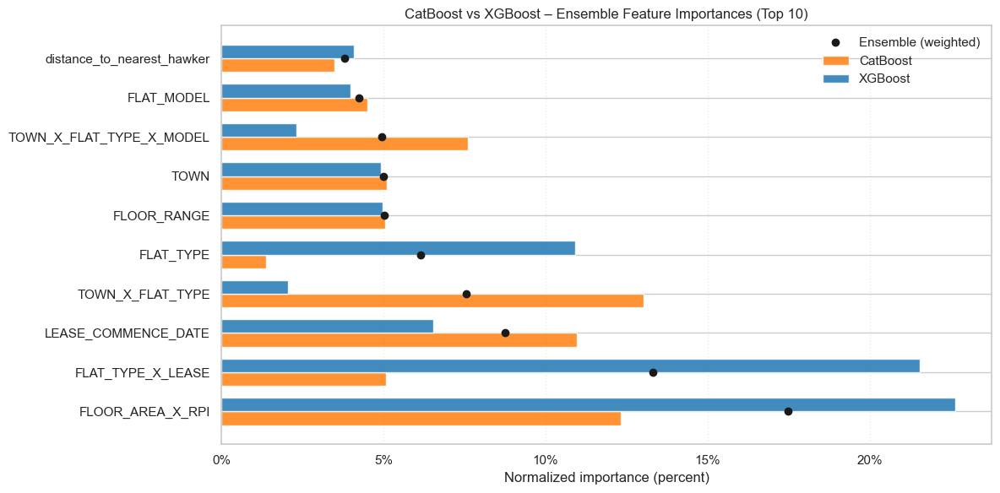

                   feature   cat   xgb ensemble
          FLOOR_AREA_X_RPI 0.123 0.226    0.175
         FLAT_TYPE_X_LEASE 0.051 0.215    0.133
       LEASE_COMMENCE_DATE 0.109 0.065    0.087
          TOWN_X_FLAT_TYPE 0.130 0.021    0.075
                 FLAT_TYPE 0.014 0.109    0.061
               FLOOR_RANGE 0.051 0.050    0.050
                      TOWN 0.051 0.049    0.050
  TOWN_X_FLAT_TYPE_X_MODEL 0.076 0.023    0.050
                FLAT_MODEL 0.045 0.040    0.042
distance_to_nearest_hawker 0.035 0.041    0.038


In [212]:
# ============================================================
# STEP 9d — Ensemble Feature Importance Visualization
# ============================================================

# Robust Ensemble Feature Importance (CatBoost orange, legend top-right)
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from textwrap import shorten

def _normalize_series(s: pd.Series) -> pd.Series:
    s = s.clip(lower=0)
    total = float(s.sum())
    if total <= 0:
        return s * 0.0
    return s / total

def _display_name(name: str) -> str:
    # unify CatBoost "_cat" columns with original names
    return name[:-4] if isinstance(name, str) and name.endswith("_cat") else name

def _cat_importances(cat_model, cat_features: list[str]) -> pd.Series:
    imp = np.array(cat_model.get_feature_importance())
    if imp.shape[0] != len(cat_features):
        raise ValueError(
            f"CatBoost importance length {imp.shape[0]} != len(cat_features) {len(cat_features)}"
        )
    s = pd.Series(imp, index=[_display_name(c) for c in cat_features], dtype=float)
    return _normalize_series(s)

def _xgb_importances(xgb_model, xgb_features: list[str], importance_type: str = "gain") -> pd.Series:
    booster = xgb_model.get_booster()
    raw = booster.get_score(importance_type=importance_type)  # keys may be 'f0' or real names
    vals = []
    for i, f in enumerate(xgb_features):
        if f in raw:
            vals.append(raw[f])
        else:
            vals.append(raw.get(f"f{i}", 0.0))
    s = pd.Series(vals, index=[_display_name(c) for c in xgb_features], dtype=float)
    return _normalize_series(s)

def plot_ensemble_feature_importance_robust(
    cat_model,
    xgb_model,
    cat_features: list[str],
    xgb_features: list[str],
    max_features: int = 25,
    weights: tuple[float, float] = (0.5, 0.5),
    shorten_to: int | None = 40,
    importance_type: str = "gain",
    title: str | None = None,
    figsize: tuple[int, int] = (12, 7),
    try_alt_xgb_types: bool = True,
    cat_color: str = "#ff7f0e",  # orange
    xgb_color: str = "#1f77b4",  # blue
    legend_loc: str = "upper right",
):
    """Plot CatBoost and XGBoost importances side-by-side and weighted ensemble."""
    w_cat, w_xgb = weights

    # CatBoost importances
    cat_s = _cat_importances(cat_model, cat_features)

    # XGBoost importances (auto-retry alternative importance types if zeros)
    tried = [importance_type]
    xgb_s = _xgb_importances(xgb_model, xgb_features, importance_type=importance_type)
    if try_alt_xgb_types and float(xgb_s.sum()) <= 0.0:
        for t in ["total_gain", "weight", "cover", "total_cover"]:
            if t in tried:
                continue
            xgb_s = _xgb_importances(xgb_model, xgb_features, importance_type=t)
            tried.append(t)
            if float(xgb_s.sum()) > 0.0:
                print(f"XGBoost importance_type auto-selected: {t}")
                break

    # Align on union of names
    all_names = sorted(set(cat_s.index) | set(xgb_s.index))
    cat_aligned = cat_s.reindex(all_names).fillna(0.0)
    xgb_aligned = xgb_s.reindex(all_names).fillna(0.0)

    # Weighted ensemble
    ensemble = w_cat * cat_aligned + w_xgb * xgb_aligned

    df = (
        pd.DataFrame({
            "feature": all_names,
            "cat": cat_aligned.values,
            "xgb": xgb_aligned.values,
            "ensemble": ensemble.values,
        })
        .sort_values("ensemble", ascending=False)
        .head(max_features)
        .copy()
    )

    # Labels
    if shorten_to:
        df["label"] = df["feature"].apply(lambda s: shorten(str(s), width=shorten_to, placeholder="…"))
    else:
        df["label"] = df["feature"]

    # Diagnostics
    print("Diagnostics:")
    print(" - cat_importance_sum:", float(cat_s.sum()))
    print(" - xgb_importance_sum:", float(xgb_s.sum()))
    print(" - features_union:", len(all_names))
    print(" - top_rows:", len(df))

    # Plot
    plt.figure(figsize=figsize)
    y = np.arange(len(df))[::-1]
    bar_h = 0.35
    plt.barh(y + bar_h/2, df["cat"].values, height=bar_h, color=cat_color, alpha=0.85, label="CatBoost")
    plt.barh(y - bar_h/2, df["xgb"].values, height=bar_h, color=xgb_color, alpha=0.85, label="XGBoost")
    plt.plot(df["ensemble"].values, y, "ko", label="Ensemble (weighted)")

    plt.yticks(y, df["label"].values)
    plt.gca().invert_yaxis()
    plt.gca().xaxis.set_major_formatter(lambda v, pos: f"{v*100:.0f}%")
    plt.grid(axis="x", linestyle=":", alpha=0.4)
    plt.xlabel("Normalized importance (percent)")
    if title is None:
        title = f"Feature Importances – Cat vs XGB (top {len(df)})"
    plt.title(title)
    plt.legend(loc=legend_loc, frameon=False)
    plt.tight_layout()
    plt.show()

    print(df[["feature", "cat", "xgb", "ensemble"]].to_string(index=False,
          formatters={"cat": "{:.3f}".format, "xgb": "{:.3f}".format, "ensemble": "{:.3f}".format}))
    return df

# Example call (works with your notebook variables):
try:
    cat_features = list(catboost_features)
except NameError:
    cat_features = list(X_cat.columns)

try:
    xgb_feats = list(X_xgb.columns)
except NameError:
    xgb_feats = list(xgb_features)

# Plot top 10 ensemble importances (using your existing function)
cat_features = list(catboost_features) if 'catboost_features' in globals() else list(X_cat.columns)
xgb_feats = list(X_xgb.columns) if 'X_xgb' in globals() else list(xgb_features)

_ = plot_ensemble_feature_importance_robust(
    final_cat_model,
    final_xgb_model,
    cat_features=cat_features,
    xgb_features=xgb_feats,
    max_features=10,  # <- Top 10
    weights=(0.5, 0.5),
    importance_type="gain",  # auto-switches if zeros
    title="CatBoost vs XGBoost – Ensemble Feature Importances (Top 10)",
    figsize=(12, 6),
    try_alt_xgb_types=True,
    cat_color="#ff7f0e",
    xgb_color="#1f77b4",
    legend_loc="upper right",
)

=== ERROR ANALYSIS BY PRICE RANGE ===


/var/folders/j_/1jv8vcms5z32pv1h455d7g1w0000gn/T/ipykernel_92556/1879234344.py:34: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  train_df_with_error.groupby('price_bin')


,Mean_Abs_Error,Median_Abs_Error,Mean_Pct_Error,Median_Pct_Error,Count
price_bin,,,,,
<300K,12226.77,9572.05,4.74,3.67,12366
300-500K,14064.80,10818.44,3.54,2.72,72281
500-700K,18354.77,14098.34,3.14,2.43,51801
700-900K,24728.63,19011.79,3.17,2.44,19542
>900K,36409.88,27056.20,3.55,2.71,6474



=== ERROR ANALYSIS BY FLAT_TYPE (Top 10 by Mean Abs Error) ===


,Mean_Abs_Error,Median_Abs_Error,Mean_Pct_Error,Median_Pct_Error,Count
FLAT_TYPE,,,,,
multi generation,38247.94,28527.07,4.29,3.45,68
executive,26799.81,20373.91,3.69,2.94,11794
5-room,20330.72,15087.86,3.31,2.56,40034
4-room,16442.58,12263.67,3.23,2.47,68740
3-room,13978.38,10628.12,3.94,2.98,38572
1-room,11089.88,8513.27,5.38,3.81,56
2-room,10911.81,8610.79,3.83,2.95,3200



=== TOP 20 WORST PREDICTIONS ===


,RESALE_PRICE,pred,error,FLAT_TYPE,TOWN,FLOOR_AREA_SQM,REMAINING_LEASE,FLAT_MODEL
13603,1088000.0,6.328048e+05,455195.177523,4-room,bukit merah,131.0,52,adjoined flat
69684,1260000.0,8.233006e+05,436699.391892,5-room,ang mo kio,134.0,54,adjoined flat
124394,1230000.0,8.496074e+05,380392.639824,4-room,bishan,113.0,63,model a
113228,1550000.0,1.221350e+06,328650.175750,5-room,queenstown,124.0,87,improved
123085,1568000.0,1.241048e+06,326951.799118,3-room,kallang/whampoa,366.7,47,terrace
120778,1188000.0,8.852182e+05,302781.815761,5-room,queenstown,150.0,51,adjoined flat
141368,1380000.0,1.088421e+06,291579.439143,5-room,marine parade,157.0,51,adjoined flat
111157,300000.0,5.588258e+05,-258825.785355,4-room,tampines,84.0,61,simplified
27213,900000.0,1.156562e+06,-256562.497663,executive,bedok,163.0,54,adjoined flat
37494,1448000.0,1.192171e+06,255829.120794,executive,bishan,141.0,67,apartment



=== KEY INSIGHTS (refined) ===
High-price (> $900K) mean pct error:   3.55%
Others (weighted) mean pct error:     3.46%
High-price (> $900K) median pct error: 2.71%
Others (weighted) median pct error:    2.66%
High-price flats have slightly higher pct error than the rest (by mean).
Highest Mean_Pct_Error bin: <300K (4.74%).
Note: The lowest-price bin often has the highest relative error (small denominators, noisier valuations).


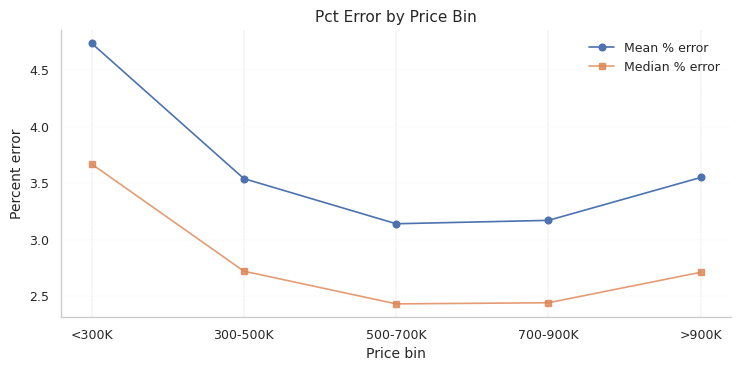

In [229]:
# ============================================================
# STEP 9e — Error Analysis: Where Does the Model Struggle? (refined)
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display

# --- Guards & setup ---
assert 'train_df' in globals(), "train_df is not defined"
assert 'oof_ensemble' in globals(), "oof_ensemble not found — run CV/OOF cells first"
assert len(oof_ensemble) == len(train_df), "Length mismatch between OOF and train_df; ensure same ordering and no filtering in between"

# Copy and attach OOF predictions
train_df_with_error = train_df.copy()
train_df_with_error['pred'] = oof_ensemble
train_df_with_error['error'] = train_df_with_error['RESALE_PRICE'] - train_df_with_error['pred']
train_df_with_error['abs_error'] = np.abs(train_df_with_error['error'])
train_df_with_error['pct_error'] = 100.0 * train_df_with_error['abs_error'] / train_df_with_error['RESALE_PRICE']

# --- 1) Error by price range (robust binning) ---
price_bins = [0, 300000, 500000, 700000, 900000, np.inf]
price_labels = ['<300K', '300-500K', '500-700K', '700-900K', '>900K']
train_df_with_error['price_bin'] = pd.cut(
    train_df_with_error['RESALE_PRICE'],
    bins=price_bins,
    labels=price_labels,
    right=False,           # [0,300000) means <300K, [300000,500000) etc.
    include_lowest=True
)

error_by_price = (
    train_df_with_error.groupby('price_bin')
    .agg({
        'abs_error': ['mean', 'median'],
        'pct_error': ['mean', 'median'],
        'RESALE_PRICE': 'count'
    })
    .round(2)
)
error_by_price.columns = ['Mean_Abs_Error', 'Median_Abs_Error', 'Mean_Pct_Error', 'Median_Pct_Error', 'Count']

print("=== ERROR ANALYSIS BY PRICE RANGE ===")
display(error_by_price)

# --- 2) Error by FLAT_TYPE ---
error_by_type = (
    train_df_with_error.groupby('FLAT_TYPE')
    .agg({
        'abs_error': ['mean', 'median'],
        'pct_error': ['mean', 'median'],
        'RESALE_PRICE': 'count'
    })
    .round(2)
)
error_by_type.columns = ['Mean_Abs_Error', 'Median_Abs_Error', 'Mean_Pct_Error', 'Median_Pct_Error', 'Count']
error_by_type = error_by_type.sort_values('Mean_Abs_Error', ascending=False)

print("\n=== ERROR ANALYSIS BY FLAT_TYPE (Top 10 by Mean Abs Error) ===")
display(error_by_type.head(10))

# --- 3) Top 20 worst predictions ---
worst_preds = train_df_with_error.nlargest(20, 'abs_error')[
    ['RESALE_PRICE', 'pred', 'error', 'FLAT_TYPE', 'TOWN', 'FLOOR_AREA_SQM', 'REMAINING_LEASE', 'FLAT_MODEL']
]
print("\n=== TOP 20 WORST PREDICTIONS ===")
display(worst_preds)

# --- 4) Clearer narrative: high vs others (weighted) + highest-error bin ---
print("\n=== KEY INSIGHTS (refined) ===")

def _weighted_avg(df, value_col, weight_col):
    w = df[weight_col].sum()
    return float((df[value_col] * df[weight_col]).sum() / w) if w else np.nan

# Ensure a consistent order and gracefully handle missing bins
present_bins = [b for b in price_labels if b in error_by_price.index]
tbl = error_by_price.loc[present_bins].copy()

if '>900K' in tbl.index:
    high_mean = float(tbl.loc['>900K', 'Mean_Pct_Error'])
    high_median = float(tbl.loc['>900K', 'Median_Pct_Error'])
    others_df = tbl.drop(index=['>900K']) if len(tbl) > 1 else tbl.iloc[0:0]
    weighted_mean_others = _weighted_avg(others_df, 'Mean_Pct_Error', 'Count') if len(others_df) else np.nan
    weighted_median_others = _weighted_avg(others_df, 'Median_Pct_Error', 'Count') if len(others_df) else np.nan

    print(f"High-price (> $900K) mean pct error:   {high_mean:.2f}%")
    print(f"Others (weighted) mean pct error:     {weighted_mean_others:.2f}%")
    print(f"High-price (> $900K) median pct error: {high_median:.2f}%")
    print(f"Others (weighted) median pct error:    {weighted_median_others:.2f}%")

    # Soft comparison message with a small tolerance to avoid noisy claims
    tol = 0.05
    if np.isnan(high_mean) or np.isnan(weighted_mean_others):
        msg = "High vs others: insufficient data to compare reliably."
    elif high_mean > weighted_mean_others + tol:
        msg = "High-price flats have slightly higher pct error than the rest (by mean)."
    elif high_mean + tol < weighted_mean_others:
        msg = "High-price flats have slightly lower pct error than the rest (by mean)."
    else:
        msg = "High-price flats have similar pct error to the rest (by mean)."
    print(msg)
else:
    print("No >$900K bin found; skipping high-vs-others comparison.")

# Highlight the truly highest relative-error segment (by Mean_Pct_Error)
if len(tbl):
    top_bin = tbl['Mean_Pct_Error'].idxmax()
    print(f"Highest Mean_Pct_Error bin: {top_bin} ({tbl.loc[top_bin, 'Mean_Pct_Error']:.2f}%).")
    if '<300K' in tbl.index and top_bin == '<300K':
        print("Note: The lowest-price bin often has the highest relative error (small denominators, noisier valuations).")

# Optional: quick error-by-price plot (remove if not needed)
try:
    fig, ax = plt.subplots(figsize=(7.5, 3.8))
    ax.plot(tbl.index, tbl['Mean_Pct_Error'], marker='o', label='Mean % error')
    ax.plot(tbl.index, tbl['Median_Pct_Error'], marker='s', label='Median % error', alpha=0.8)
    ax.set_title('Pct Error by Price Bin')
    ax.set_xlabel('Price bin')
    ax.set_ylabel('Percent error')
    ax.grid(axis='y', linestyle=':', alpha=0.4)
    ax.legend(frameon=False)
    plt.tight_layout()
    plt.show()
except Exception as e:
    print('Plot skipped:', e)

Relative accuracy is best in the 500–900K range; <300K has the highest percent error, while >900K shows a small uptick due to sparse, premium cases. Absolute dollar errors are naturally concentrated in the high‑price segment.